# EED mKO vs WT - comparison of (allelic) _in silico_ data

In [1]:
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
from glob import glob
from scipy.signal import gaussian, fftconvolve
from matplotlib import gridspec
from scipy import signal
from scipy import stats

rs = np.random.RandomState()
rs.seed(42)

import sys
sys.path.append('../../combining_all_data/bin/')
sys.path.append('../bin/')
from preimplantation_toolkit import *
import preimplantation_load_data as ld

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

FIGOUTDIR = '../output/figures/6_Preimplantation.EED_mKO_experiments.part1.initial_comparison_insilico_populations/'

In [3]:
! mkdir -p $FIGOUTDIR || true;

In [4]:
HOME = '/Users/f.rang/surfdrive/Kind/data/'

BINSIZE = 100000
MINMAP_PER_KB = 1
MINMAP = int(MINMAP_PER_KB * BINSIZE / 1000)

ANNOFN = HOME + 'projects/preimplantation/combining_all_data/metadata/FR230814.samplesheet.tsv'
COLORFN = '../colors/manuscript_colors.tsv'

# DamID file names
COUNTS = '../../combining_all_data/data/damid_counts/FR230814.DamID.sample_counts.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
BINARY = '../../combining_all_data/data/damid_binary/FR230814.DamID.sample_smooth_binary.{construct}.all_stages.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
CONTFC = '../../combining_all_data/data/damid_CF/FR230814.DamID.contact_frequency.{construct}.{stage}.{treatment}.{genotype}.damid_pass.binsize_{binsize:d}.hdf5'
INSILICO = '../../combining_all_data/data/damid_insilico/FR230814.DamID.insilico_counts.{construct}.{stage}.{treatment}.{genotype}.{sample}_samples.damid_pass.binsize_{binsize:d}.hdf5'
LADFN = '../../combining_all_data/data/damid_LADs/FR230814.all_DamID.LAD_calls.{construct}.{stage}.{treatment}.{genotype}.bed.gz'

ALLELEFILTFN = '../../combining_all_data/data/damid_allelic_filter/FR230814.allelic_filter_based_on_visibility_and_bias.{genotype}.binsize_{binsize:d}.hdf5'

# DamID mappability
MAPFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.bowtie2_very_sensitive_N1.readlength_65.counts.pos.hdf5"
POSFN = HOME + "references/mouse/mm10/mappability/Mus_musculus.GRCm38.dna.primary_assembly.with_ERCC.GATC.posarray.hdf5"

# Gene information
GENESFN = HOME + 'references/mouse/mm10/genomic_element_info/FR200630.BioMart.mm10.all_genes.top_transcripts.txt.gz'
PARKFN = HOME + 'projects/preimplantation/DRA001066/data/tables/FR200923.Park_clusters_by_Ensembl_ID.tsv'

# Repeat information
REPEATFN = HOME + 'references/mouse/mm10/repeat_masker/mm10.RepeatMasker.txt.gz'

# 1. Loading our own data

In [5]:
color_dict = ld.load_color_dict(COLORFN)

## 1.1 Loading samplesheet

In [6]:
stage_order = ['zygote', '2cell', '8cell', 'morula', 'early_blastocyst', 'mESC']
treatment_order = ['no_treatment', 'EED_ctrl', 'EED_mKO', 'Lap2b', 'Cbx7(CD)-Lap2b', 'Cbx7(CD)-Emd', 'Cbx7(CD)-Lbr']
chrom_order = [str(c) for c in range(1,20)] + ['X', 'Y']

In [7]:
anno = pd.read_csv(ANNOFN, sep='\t')
anno = anno[anno['construct'] == 'Lmnb1'].reset_index(drop=True)
anno = anno[anno['stage'].isin(stage_order)]
anno = anno[anno.cellcount == 1]
anno = anno[anno.treatment.isin(treatment_order)]
anno = anno.set_index('damid_name')
anno = anno[anno.DamID_PASS]

In [8]:
anno.groupby(['stage', 'genotype', 'treatment']).size()

stage   genotype                treatment     
2cell   C57BL/6J_x_JF1/Ms       EED_ctrl           87
                                EED_mKO            54
        CBAB6F1_x_CAST/EiJ      Cbx7(CD)-Lap2b     39
                                Lap2b              11
                                no_treatment       26
        homozygous              Cbx7(CD)-Emd       17
                                Cbx7(CD)-Lap2b     28
                                Cbx7(CD)-Lbr       22
                                Lap2b              31
                                no_treatment      197
8cell   CBAB6F1_x_CAST/EiJ      Cbx7(CD)-Lap2b     35
                                no_treatment       21
        homozygous              no_treatment      183
mESC    129S1/SvImJ_x_CAST/EiJ  no_treatment      268
zygote  CBAB6F1_x_CAST/EiJ      no_treatment       14
        homozygous              no_treatment      107
dtype: int64

__Generate a samplesheet for in silico populations__

In [9]:
anno_comb = anno[anno.DamID_PASS].groupby(['stage', 'fusion_construct', 'genotype', 'treatment', 'is_heterozygous']).size().reset_index().drop(columns=[0])
anno_comb['stage'] = pd.Categorical(anno_comb['stage'], categories=['zygote', '2cell', '8cell', 'morula', 'early_blastocyst', 'mESC'])
anno_comb['is_singlecell'] = True
anno_comb.loc[anno_comb.stage.isin(['morula', 'early_blastocyst']), 'is_singlecell'] = False
anno_comb = anno_comb.sort_values(by=['stage', 'is_heterozygous', 'genotype', 'treatment'])
anno_comb

,stage,fusion_construct,genotype,treatment,is_heterozygous,is_singlecell
15,zygote,Dam-Lmnb1,homozygous,no_treatment,False,True
14,zygote,Dam-Lmnb1,CBAB6F1_x_CAST/EiJ,no_treatment,True,True
5,2cell,Dam-Lmnb1,homozygous,Cbx7(CD)-Emd,False,True
6,2cell,Dam-Lmnb1,homozygous,Cbx7(CD)-Lap2b,False,True
7,2cell,Dam-Lmnb1,homozygous,Cbx7(CD)-Lbr,False,True
8,2cell,Dam-Lmnb1,homozygous,Lap2b,False,True
9,2cell,Dam-Lmnb1,homozygous,no_treatment,False,True
0,2cell,Dam-Lmnb1,C57BL/6J_x_JF1/Ms,EED_ctrl,True,True
1,2cell,Dam-Lmnb1,C57BL/6J_x_JF1/Ms,EED_mKO,True,True
2,2cell,Dam-Lmnb1,CBAB6F1_x_CAST/EiJ,Cbx7(CD)-Lap2b,True,True


## 1.2 Loading mappability

In [10]:
GENOTYPE2PARENT = {
    '129S1/SvImJ_x_CAST/EiJ': {
        'maternal': 'unique_129S1_SvImJ_snps',
        'paternal': 'unique_CAST_EiJ_snps'
    },
    
    'CBAB6F1_x_CAST/EiJ': {
        'maternal': 'unique_CBABL6F1_snps',
        'paternal': 'unique_CAST_snps'
    },
    
    'C57BL/6J_x_JF1/Ms': {
        'maternal': 'unique_C57BL_6J_snps',
        'paternal': 'unique_JF1_Ms_snps'
    }
}

In [11]:
mapab = ld.load_mappability(POSFN, MAPFN, chrom_order, BINSIZE)

In [12]:
mapab_gt = ld.load_mapab_from_count_file_heterozygous(COUNTS, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

## 1.3 Loading data

__Sample counts__

In [13]:
damid_counts = ld.load_sample_damid_counts_heterozygous(COUNTS, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ maternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ paternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ combined
Dam-Lmnb1 C57BL/6J_x_JF1/Ms maternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms paternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms combined
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ maternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ paternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ combined
Dam-Lmnb1 homozygous combined


__Binary sample counts__

In [14]:
damid_binary = ld.load_sample_damid_binary_heterozygous(BINARY, anno, BINSIZE, GENOTYPE2PARENT, chrom_order)

Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ maternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ paternal
Dam-Lmnb1 129S1/SvImJ_x_CAST/EiJ combined
Dam-Lmnb1 C57BL/6J_x_JF1/Ms maternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms paternal
Dam-Lmnb1 C57BL/6J_x_JF1/Ms combined
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ maternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ paternal
Dam-Lmnb1 CBAB6F1_x_CAST/EiJ combined
Dam-Lmnb1 homozygous combined


__Contact Frequency__

In [15]:
if BINSIZE >= 100000:
    contact_freq =  {p: dict() for p in ['maternal', 'paternal', 'combined']}

    for info, df in anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous']):

        # load combined
        gt_name = info[2] if not info[-1] else info[2].replace('/','') + '.combined'
        fn = CONTFC.format(construct = info[0], stage = info[1], treatment = info[3], genotype = gt_name, binsize=BINSIZE)
        name = (info[1], info[2], info[3])

        if len(glob(fn)) == 0:
            print('CF does not exist for', info)
            continue

        contact_freq['combined'][name] =  load_count_file(fn)

        if info[-1]:
            for parent, gt in GENOTYPE2PARENT[info[2]].items():
                gt_name = info[2].replace('/','') + '.' + gt
                fn = CONTFC.format(construct = info[0], stage = info[1], treatment = info[3], genotype = gt_name, binsize=BINSIZE)
                contact_freq[parent][name] =  load_count_file(fn)

__in silico populations__

In [16]:
damid_insilico = {p: dict() for p in ['maternal', 'paternal', 'combined']}

for info, df in anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous']):
    
    assert len(anno.fusion_construct.unique()) == 1
    
    # load combined
    gt_name = info[2] if not info[-1] else info[2].replace('/','') + '.combined'
    fn = INSILICO.format(
        construct = info[0], stage = info[1], treatment = info[3], 
        sample = '1cell', genotype = gt_name, binsize=BINSIZE
    )
    fns = glob(fn)
    print(info, len(fns))
    name = (info[1], info[2], info[3])
    
    for fn in fns:
        counts = load_count_file(fn)
        counts = {c: counts[c].astype(int) for c in chrom_order}
        
        if name in damid_insilico['combined']:
            damid_insilico['combined'][name] = {c: damid_insilico['combined'][name][c] + counts[c] for c in chrom_order}
        else:
            damid_insilico['combined'][name] = counts

    # load parental
    if info[-1]:
        for parent, gt in GENOTYPE2PARENT[info[2]].items():
            gt_name = info[2].replace('/','') + '.' + gt
            fn = INSILICO.format(
                construct = info[0], stage = info[1], treatment = info[3], 
                sample = '1cell', genotype = gt_name, binsize=BINSIZE
            )
            fns = glob(fn)
            
            for fn in fns:
                counts =  load_count_file(fn)
                counts = {c: counts[c].astype(int) for c in chrom_order}

                if name in damid_insilico[parent]:
                    damid_insilico[parent][name] = {c: damid_insilico[parent][name][c] + counts[c] for c in chrom_order}
                else:
                    damid_insilico[parent][name] = counts
                

('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl', True) 1
('Dam-Lmnb1', '2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO', True) 1
('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b', True) 1
('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b', True) 1
('Dam-Lmnb1', '2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment', True) 1
('Dam-Lmnb1', '2cell', 'homozygous', 'Cbx7(CD)-Emd', False) 1
('Dam-Lmnb1', '2cell', 'homozygous', 'Cbx7(CD)-Lap2b', False) 1
('Dam-Lmnb1', '2cell', 'homozygous', 'Cbx7(CD)-Lbr', False) 1
('Dam-Lmnb1', '2cell', 'homozygous', 'Lap2b', False) 1
('Dam-Lmnb1', '2cell', 'homozygous', 'no_treatment', False) 1
('Dam-Lmnb1', '8cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b', True) 1
('Dam-Lmnb1', '8cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment', True) 1
('Dam-Lmnb1', '8cell', 'homozygous', 'no_treatment', False) 1
('Dam-Lmnb1', 'mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment', True) 1
('Dam-Lmnb1', 'zygote', 'CBAB6F1_x_CAST/EiJ', 'no_treatment', True) 1
('Dam-Lmnb1', 'zygote'

__RPKM normalization of _in silico_ populations__

In [17]:
damid_insilico_rpkm = {p: dict() for p in ['maternal', 'paternal', 'combined']}

# Normalize DamID data
for _, row in anno_comb.iterrows():
    sample = (row['stage'], row['genotype'], row['treatment'])
    gt = row['genotype']
    
    for parent in damid_insilico:
        if sample not in damid_insilico[parent]:
            print(sample)
            continue


        if parent in ['maternal', 'paternal']:
            dm = sum([damid_insilico['maternal'][sample][c].sum() for c in chrom_order])
            dp = sum([damid_insilico['paternal'][sample][c].sum() for c in chrom_order])
            d = dm + dp

            counts = damid_insilico[parent][sample]
            damid_insilico_rpkm[parent][sample] = rpkm_normalize(counts, binsize=BINSIZE, depth=d)

        else:
            counts = damid_insilico[parent][sample]
            damid_insilico_rpkm[parent][sample] = rpkm_normalize(counts, binsize=BINSIZE)



('zygote', 'homozygous', 'no_treatment')
('zygote', 'homozygous', 'no_treatment')
('2cell', 'homozygous', 'Cbx7(CD)-Emd')
('2cell', 'homozygous', 'Cbx7(CD)-Emd')
('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
('2cell', 'homozygous', 'Cbx7(CD)-Lbr')
('2cell', 'homozygous', 'Cbx7(CD)-Lbr')
('2cell', 'homozygous', 'Lap2b')
('2cell', 'homozygous', 'Lap2b')
('2cell', 'homozygous', 'no_treatment')
('2cell', 'homozygous', 'no_treatment')
('8cell', 'homozygous', 'no_treatment')
('8cell', 'homozygous', 'no_treatment')


__log2OE normalization of _in silico_ populations__

In [18]:
PC = 0.1
damid_insilico_logoe = {p: dict() for p in ['maternal', 'paternal', 'combined']}

# RPKM normalize mappability data
mapab_rpkm = dict()
for gt in mapab_gt:
    mapab_rpkm[gt] = dict()
    
    for p in mapab_gt[gt]:
        m = mapab_gt[gt][p]
        
        if p in ['maternal', 'paternal']:
            dm = sum([mapab_gt[gt]['maternal'][c].sum() for c in chrom_order])
            dp = sum([mapab_gt[gt]['paternal'][c].sum() for c in chrom_order])
            d = dm+dp
            m = rpkm_normalize(m, binsize=BINSIZE, depth=d)
        else:
            m = rpkm_normalize(m, binsize=BINSIZE)
            
        mapab_rpkm[gt][p] = m
        

# Normalize DamID data
for _, row in anno_comb.iterrows():
    sample = (row['stage'], row['genotype'], row['treatment'])
    gt = row['genotype']
    
    for parent in damid_insilico:
        if sample not in damid_insilico[parent]:
            print(sample)
            continue
            
        rpkm = damid_insilico_rpkm[parent][sample]
        damid_insilico_logoe[parent][sample] = {c: np.log2( (rpkm[c] + PC) / (mapab_rpkm[gt][parent][c] + PC) ) for c in chrom_order}


('zygote', 'homozygous', 'no_treatment')
('zygote', 'homozygous', 'no_treatment')
('2cell', 'homozygous', 'Cbx7(CD)-Emd')
('2cell', 'homozygous', 'Cbx7(CD)-Emd')
('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
('2cell', 'homozygous', 'Cbx7(CD)-Lbr')
('2cell', 'homozygous', 'Cbx7(CD)-Lbr')
('2cell', 'homozygous', 'Lap2b')
('2cell', 'homozygous', 'Lap2b')
('2cell', 'homozygous', 'no_treatment')
('2cell', 'homozygous', 'no_treatment')
('8cell', 'homozygous', 'no_treatment')
('8cell', 'homozygous', 'no_treatment')


__Loading LADs__

In [19]:
# damid_lads = {p: dict() for p in ['maternal', 'paternal', 'combined']}

# for info, df in anno.groupby(['fusion_construct', 'stage', 'genotype', 'treatment', 'is_heterozygous']):
    
#     if info[0] != 'Dam-Lmnb1':
#         continue
        
#     parents = ['combined', 'maternal', 'paternal'] if info[-1] else ['combined']
    
#     for parent in parents:
    
#         # load combined
#         snp = 'combined' if parent == 'combined' else GENOTYPE2PARENT[info[2]][parent]
#         gt_name = info[2] if not info[-1] else info[2].replace('/','') + '.' + snp
#         fn = LADFN.format(
#             construct = info[0], stage = info[1], treatment = info[3], 
#             genotype = gt_name
#         )

#         name = (info[1], info[2], info[3])
        
#         damid_lads[parent][name] = pd.read_table(fn, names=['chrom', 'start', 'end'])
                

## 1.4 Loading allele visibility

In [20]:
allele_filt_gt = dict()

for gt in GENOTYPE2PARENT:
    
    fn = ALLELEFILTFN.format(genotype=gt.replace('/',''), binsize=BINSIZE)
    allele_filt_gt[gt] = dict()
    
    with h5py.File(fn, 'r') as f:
        for c in chrom_order:
            allele_filt_gt[gt][c] = f[c][:].astype(bool)
    
allele_filt_total = dict()

for c in chrom_order:
    filt = np.array([allele_filt_gt[gt][c] for gt in allele_filt_gt]).astype(int)
    filt = filt.sum(axis=0) == len(allele_filt_gt.keys())
    allele_filt_total[c] = filt

# 3. Loading external data sets

In [21]:
FN = '../../combining_all_external_data/metadata/external_data_combined_samples.tsv'
ext_anno = pd.read_table(FN)
ext_anno = ext_anno[ext_anno.treatment == 'no']

samples = ext_anno.loc[ext_anno.target.isin(['H2AK119ub1', 'H3K27me3', 'H3K9me3', 'H3K4me3', 'H3K27ac', 'H3K9ac']), 'sample_id'].values
controls = ext_anno.loc[ext_anno.sample_id.isin(samples) & (ext_anno.control_id != 'none'), 'control_id'].values
samples = np.concatenate([samples, controls])
ext_anno = ext_anno[ext_anno.sample_id.isin(samples)]
ext_anno = ext_anno[~((ext_anno.dataset_id == 'GSE71434') & (ext_anno.target == 'H3K27me3'))]

select_stages = [
    'sperm', 'FG_oocyte', 'GV_oocyte', 'MII_oocyte', 
    'PN3_zygote', 'PN5_zygote', 
    '2cell_early', '2cell', '2cell_late',
    '4cell', '8cell', 'morula', 'blastocyst', 'ICM', 'mESC'
]
ext_anno = ext_anno[ext_anno.stage.isin(select_stages)]

ext_anno['stage'] = pd.Categorical(ext_anno['stage'], select_stages)

FNFMT = {
    'combined': '../../combining_all_external_data/data/binned/FR230828.external_data.RPKM.binsize_%d.tsv.gz',
    'maternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_maternal.RPKM.binsize_%d.tsv.gz',
    'paternal': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.unique_paternal.RPKM.binsize_%d.tsv.gz',
    'allele_vis': '../../combining_all_external_data/data/binned/FR230828.external_data.allelic.allele_vis.fraction.binsize_%d.tsv.gz'
}

In [22]:
ext_data = {p: dict() for p in ['combined', 'maternal', 'paternal', 'allele_vis']}

for dat, fnfmt in FNFMT.items():
    fn = fnfmt % BINSIZE
    df = pd.read_table(fn, dtype={'chrom': str})
    
    for sample in ext_anno.sample_id.values:
        if sample not in df.columns:
            continue
            
        bed = df[['chrom', 'start', 'end', sample]].copy().rename(columns={sample: 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data[dat][sample] = {c: data[c][:len(mapab[c])] for c in chrom_order}
        
    if dat == 'combined':
        bed = df[['chrom', 'start', 'end', 'blacklisted']].copy().rename(columns={'blacklisted': 'reads'})
        data = convert_bedgraph_to_hdf5dict(bed, binsize=BINSIZE)
        ext_data['blacklisted'] = {c: data[c][:len(mapab[c])] for c in chrom_order}

In [23]:
ext_data['maternal_corrected'] = dict()
ext_data['paternal_corrected'] = dict()

for sample in ext_data['allele_vis']:
    
    V = {c: np.copy(ext_data['allele_vis'][sample][c]) for c in chrom_order}
    for c in chrom_order:
        ind = (V[c] == 0) | np.isnan(V[c]) | np.isinf(V[c])
        V[c][ind] = 1
    
    for allele in ['maternal', 'paternal']:
        ext_data['%s_corrected' % allele][sample] = {c: np.copy(ext_data[allele][sample][c])/V[c] for c in chrom_order}    

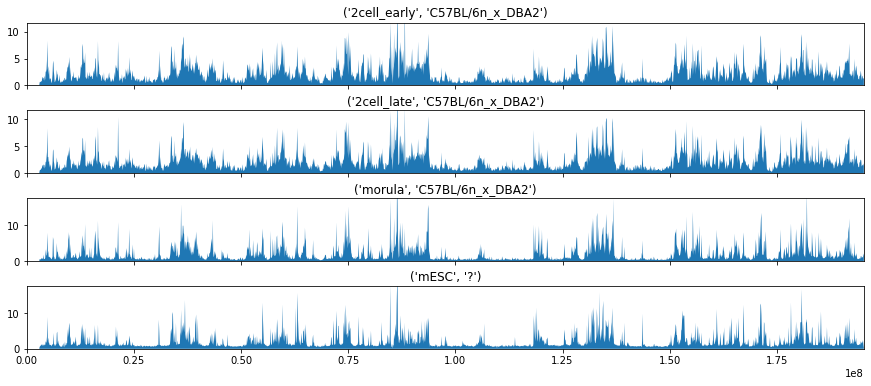

In [24]:
to_plot = ext_anno[(ext_anno.target == 'H3K9ac')].copy()
to_plot = to_plot.sort_values(by='stage')

nrow = len(to_plot)
fig, axes = plt.subplots(nrow, 1, figsize=(15,nrow*1.5), sharex=True)
plt.subplots_adjust(hspace=.4)
counter = 0

chrom = '1'

for _, row in to_plot.iterrows():
    Y = ext_data['combined'][row['sample_id']][chrom]
    X = np.arange(0, len(Y)*BINSIZE, BINSIZE)
    
    ax = axes[counter]
    counter += 1
    
    ax.set_title((row['stage'], row['genotype']))
    
    
    if row['control_id'] != 'none':
        Yc = ext_data['combined'][row['control_id']][chrom]
#         ax.plot(X, Yc, c='k')
        Yoe = np.log2( (Y + 1) / (Yc + 1) )
        ax.fill_between(X, 0, Yoe)
#         ax.set_ylim(0, np.percentile(Y, 99.9))
    else:
        ax.fill_between(X, 0, Y)
        ax.set_ylim(0, np.percentile(Y, 99.9))
        
    ax.set_xlim(0, X[-1])
    

# 5. Loading genomic regions of interest

## 5.1 PADs & Collombet cluster

In [25]:
PADFN = '../../GSE118263/data/download/GSE118263.Du2020.TableS2.liftOver_to_mm10.PAD_only.bed'
COLLOMBET_FN = '../../GSE129029/data/download/GSE129029.Collombet2020.Domains_clusters_HiCAverageZscorePerStagePerGenome_genes_clean.tsv.gz'

In [26]:
collombet = pd.read_table(COLLOMBET_FN)
collombet['chrom'] = collombet.domain.apply(func = lambda c: c.split('_')[0].strip('chr'))
collombet['start'] = collombet.domain.apply(func = lambda c: int(c.split('_')[1]))
collombet['end'] = collombet.domain.apply(func = lambda c: int(c.split('_')[2]))
collombet = collombet[['chrom', 'start', 'end', 'cluster']]
collombet['chrom'] = pd.Categorical(collombet['chrom'], categories=chrom_order)
collombet['chrom'] = collombet['chrom'].astype(str)

pads = pd.read_table(PADFN, names=['chrom', 'start', 'end', 'type']).iloc[:,:-1]
pads['chrom'] = pads.chrom.apply(func = lambda c: c.strip('chr'))
pads['chrom'] = pd.Categorical(pads['chrom'], categories=chrom_order)
pads = pads.sort_values(by=['chrom', 'start'])
pads['chrom'] = pads['chrom'].astype(str)

In [27]:
#collombet[collombet['cluster']==1].to_csv('~/Desktop/Collombet.bed', header=False, index=False, sep='\t')

In [28]:
#pads.to_csv('~/Desktop/Pads.bed', header=False, index=False, sep='\t')

In [29]:
pad_density = {c: np.zeros(len(mapab[c])) for c in chrom_order}

for _, row in tqdm(pads.iterrows(), total=len(pads)):
    chrom = row['chrom']
    start = row['start']
    end = row['end']
    bins = np.arange(int(start//BINSIZE), int(np.ceil(end/BINSIZE)))
    
    if len(bins) == 1:
        pad_density[chrom][bins[0]] += (end - start)/BINSIZE
    else:
        s1 = (BINSIZE - (start % BINSIZE))/BINSIZE
        pad_density[chrom][bins[0]] += s1
        
        s2 = (end % BINSIZE)/BINSIZE
        pad_density[chrom][bins[-1]] += s2
        
        if len(bins) > 2:
            pad_density[chrom][bins[1:-1]] += 1

  0%|          | 0/3402 [00:00<?, ?it/s]

In [30]:
collombet_density = {c: np.zeros(len(mapab[c])) for c in chrom_order}

ind = collombet['cluster'] == 1
for _, row in tqdm(collombet[ind].iterrows(), total=ind.sum()):
    chrom = row['chrom']
    start = row['start']
    end = row['end']
    bins = np.arange(int(start//BINSIZE), int(np.ceil(end/BINSIZE)))
    
    if len(bins) == 1:
        collombet_density[chrom][bins[0]] += (end - start)/BINSIZE
    else:
        s1 = (BINSIZE - (start % BINSIZE))/BINSIZE
        collombet_density[chrom][bins[0]] += s1
        
        s2 = (end % BINSIZE)/BINSIZE
        collombet_density[chrom][bins[-1]] += s2
        
        if len(bins) > 2:
            collombet_density[chrom][bins[1:-1]] += 1

  0%|          | 0/805 [00:00<?, ?it/s]

# 6. Contact Frequency tracks

## 6.1 Function to plot CF tracks and differential signal for treatment

In [31]:
def do_allele_vis_correction(Y, vis):
    vis = np.copy(vis)
    ind = (vis == 0) | np.isnan(vis) | np.isinf(vis)
    vis[ind] = 1
    Y = np.copy(Y) / vis
    return Y

In [32]:
mapab_rpkm['129S1/SvImJ_x_CAST/EiJ'].keys()

dict_keys(['maternal', 'paternal', 'combined'])

In [33]:
def plot_tracks_with_differential_signal(chrom, alleles, damid_vals='CF', interval=[], ext_samples=[], figw=10, smooth_std=150000):
    
    if 'combined' not in alleles:
        anno_to_plot = anno[(anno.cellcount==1) & (anno.is_heterozygous)].copy()
    else:
        anno_to_plot = anno[anno.cellcount==1].copy()
      
    # define interesting comparisons
    comparisons = {
        'Differential NL-association - mESC vs 2-cell embryo (homozygous) - %s allele': [('mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment'), ('2cell', 'homozygous', 'no_treatment')],
        'Differential NL-association - mESC vs 2-cell embryo (hybrid) - %s allele': [('mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')],
        'Differential NL-association - EED mKO vs WT - %s allele': [('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO'), ('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl')],
        'Differential NL-association - Cbx7(CD)-Lap2b vs untreated - %s allele': [('2cell', 'homozygous', 'Cbx7(CD)-Lap2b'), ('2cell', 'homozygous', 'no_treatment')],
        'Differential NL-association - Cbx7(CD)-Lap2b vs Lap2b - %s allele': [('2cell', 'homozygous', 'Cbx7(CD)-Lap2b'), ('2cell', 'homozygous', 'Lap2b')],
        'Differential NL-association - Cbx7(CD)-Lap2b vs untreated - %s allele (hybrid)': [('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')],
        'Differential NL-association - Cbx7(CD)-Lap2b vs Lap2b - %s allele (hybrid)': [('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b')],
        'Differential NL-association - Lap2b vs untreated - %s allele (hybrid)': [('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')],
        'Differential NL-association - Cbx7(CD)-Emd vs untreated - %s allele': [('2cell', 'homozygous', 'Cbx7(CD)-Emd'), ('2cell', 'homozygous', 'no_treatment')],
        'Differential NL-association - Cbx7(CD)-Lbr vs untreated - %s allele': [('2cell', 'homozygous', 'Cbx7(CD)-Lbr'), ('2cell', 'homozygous', 'no_treatment')]
        
        
    }
    
    # filter comparisons when allelic data is not available
    keep = list()
    for k, conditions in comparisons.items():
        test1 = any([conditions[0] in contact_freq[a] for a in alleles])
        test2 = any([conditions[1] in contact_freq[a] for a in alleles])
        if test1 and test2:
            keep.append(k)
    comparisons = {k: comparisons[k] for k in keep}

    g_anno = list(anno_to_plot.groupby(['stage', 'genotype', 'treatment']))
    tmp = {stage: i for i, stage in enumerate(stage_order)}
    g_anno = sorted(g_anno, key = lambda x: (tmp[x[0][0]], x[0][1], x[0][2]))

    nrow = len(g_anno) + len(comparisons.keys()) + len(ext_samples)
    ncol = len(alleles)
    fig, axes = plt.subplots(nrow, ncol, figsize=(figw*ncol, 2.5*nrow), sharex=False)
    plt.subplots_adjust(hspace=.6)
    r_counter = 0
    
    if smooth_std > 0:
        W = gaussian(np.ceil(smooth_std / BINSIZE * 6 / 2) * 2 + 1, smooth_std / BINSIZE)
        W /= W.sum()
        
    if len(interval) == 2:
        s = int(interval[0]//BINSIZE)
        e = int(np.ceil(interval[1]/BINSIZE))
        loc_ind = np.arange(s, e)
    else:
        loc_ind = np.arange(0, len(mapab[chrom]))

    # plot CF of all stages/treatments
#     Ydict = {a: dict() for a in alleles}
    for sample, df in g_anno:
        
        for icol, allele in enumerate(alleles):
            
            ax = axes[r_counter, icol] if ncol > 1 else axes[r_counter]
            
            if sample not in contact_freq[allele]:
                ax.remove()
                continue

            if damid_vals == 'CF':
                Y = contact_freq[allele][sample][chrom]
            else:
                Y = damid_insilico_rpkm[allele][sample][chrom]
                Y = fftconvolve(Y, W, mode='same') if smooth_std > 0 else Y
                M = mapab_rpkm[sample[1]][allele][chrom]
                M = fftconvolve(M, W, mode='same') if smooth_std > 0 else M
                Y = np.log2( (Y + .1) / (M + .1) )
                
            X = np.arange(0, len(Y)*BINSIZE, BINSIZE) / 1e6
#             Ydict[allele][sample] = Y
            
            clr = color_dict['stage'][sample[0]] if allele == 'combined' else color_dict['allele'][allele]
            ax.fill_between(X[loc_ind], 0, Y[loc_ind], color=clr, lw=0)
            ax.set_xlim(X[loc_ind][0], X[loc_ind][-1])
            if damid_vals == 'CF':
                ax.set_ylim(0,1)
            ax.set_ylabel(damid_vals)

            ax.set_title('NL-association - %s - %s - %s - %s allele' % (sample[0], sample[1], sample[2], allele))
            
            # plot allele visibility if allele is maternal or paternal
            if allele != 'combined':
                ylim = ax.get_ylim()
                yrange = ylim[1] - ylim[0]
                dy = .1 #yrange*0.1

                A = allele_filt_gt[sample[1]][chrom].astype(int)
                A[mapab[chrom] < MINMAP] = 0
                A = np.atleast_2d(A[loc_ind])
                ax.imshow(A, extent=[0, X[loc_ind][-1], ylim[0]-dy, ylim[0]], aspect='auto', cmap='binary_r', vmin=0, vmax=1)
                ax.set_ylim(ylim[0]-dy, ylim[1])
                
        r_counter += 1
        
    # plot differential CF for comparisons of interest
    for title, comp_samples in comparisons.items():
        sample1 = comp_samples[0]
        sample2 = comp_samples[1]
        
        for icol, allele in enumerate(alleles):
            ax = axes[r_counter, icol] if ncol > 1 else axes[r_counter]

            if (sample1 not in contact_freq[allele]) or (sample2 not in contact_freq[allele]):
                ax.remove()
                continue
                
            if damid_vals == 'CF':
                Yd = contact_freq[allele][sample1][chrom] - contact_freq[allele][sample2][chrom]
                ylab = 'delta CF'
            else:
                Y1 = damid_insilico_rpkm[allele][sample1][chrom]
                Y1 = fftconvolve(Y1, W, mode='same') if smooth_std > 0 else Y1
                M1 = mapab_rpkm[sample1[1]][allele][chrom]
                M1 = fftconvolve(M1, W, mode='same') if smooth_std > 0 else M1
                Y1 = np.log2( (Y1 + .1) / (M1 + .1) )
                
                Y2 = damid_insilico_rpkm[allele][sample2][chrom]
                Y2 = fftconvolve(Y2, W, mode='same') if smooth_std > 0 else Y2
                M2 = mapab_rpkm[sample2[1]][allele][chrom]
                M2 = fftconvolve(M2, W, mode='same') if smooth_std > 0 else M2
                Y2 = np.log2( (Y2 + .1) / (M2 + .1) )
                
                Yd = Y1 - Y2
                ylab = 'log2FC'
                
            Yd0 = np.copy(Yd)
            Yd0[Yd < 0] = 0
            Yd1 = np.copy(Yd)
            Yd1[Yd > 0] = 0

            clr1 = color_dict['stage'][sample1[0]] if allele == 'combined' else color_dict['allele'][allele]
            clr2 = color_dict['stage'][sample2[0]] if allele == 'combined' else color_dict['allele'][allele]
            
            if allele != 'combined':
                clr1 = color_dict['allele'][allele]
                clr2 = clr2
                a1 = 1
                a2 = 0.5
            elif sample1[0] == sample2[0]:
                clr1 = color_dict['treatment'][sample1[2]]
                clr2 = color_dict['treatment'][sample2[2]]
                a1 = 1
                a2 = 1
            else:
                clr1 = color_dict['stage'][sample1[0]]
                clr2 = color_dict['stage'][sample2[0]]
                a1 = 1
                a2 = 1
            
            ax.fill_between(X[loc_ind], 0, Yd0[loc_ind], color=clr1, alpha=a1, lw=0)
            ax.fill_between(X[loc_ind], 0, Yd1[loc_ind], color=clr2, alpha=a2, lw=0)
            ax.set_ylabel(ylab)
            ax.set_title(title % allele)
            ax.set_xlim(X[loc_ind][0], X[loc_ind][-1])

            # plot allele visibility if allele is maternal or paternal
            if allele != 'combined':
                ylim = ax.get_ylim()
                yrange = ylim[1] - ylim[0]
                dy = .1 #yrange*0.1

                A = allele_filt_gt[sample[1]][chrom].astype(int)
                A[mapab[chrom] < MINMAP] = 0
                A = np.atleast_2d(A[loc_ind])
                ax.imshow(A, extent=[0, X[loc_ind][-1], ylim[0]-dy, ylim[0]], aspect='auto', cmap='binary_r', vmin=0, vmax=1)
                ax.set_ylim(ylim[0]-dy, ylim[1])

        r_counter += 1

    # plot external samples
    for ext_sample in ext_samples:
        
        for icol, allele in enumerate(alleles):
            ax = axes[r_counter, icol] if ncol > 1 else axes[r_counter]

            stage = ext_anno.loc[ext_anno.sample_id==ext_sample,'stage'].values[0]
            target = ext_anno.loc[ext_anno.sample_id==ext_sample,'target'].values[0]
            control = ext_anno.loc[ext_anno.sample_id==ext_sample,'control_id'].values[0]

            if ext_sample in ext_data[allele]:
                Y = ext_data[allele][ext_sample][chrom]
                if (control == 'none') and (allele != 'combined') and (ext_sample in ext_data['allele_vis']):
                    vis = ext_data['allele_vis'][ext_sample][chrom]
                    Y = do_allele_vis_correction(Y, vis)
                    Y = fftconvolve(Y, W, mode='same') if smooth_std > 0 else Y
                elif control != 'none':
                    Y = fftconvolve(Y, W, mode='same') if smooth_std > 0 else Y
                    Yc = ext_data[allele][control][chrom]
                    Yc = fftconvolve(Yc, W, mode='same') if smooth_std > 0 else Yc
                    Y = np.log2((Y + .1) / (Yc + .1))
                else:
                    Y = fftconvolve(Y, W, mode='same') if smooth_std > 0 else Y
                a_name = allele
            else:
                Y = ext_data['combined'][ext_sample][chrom]
                Y = fftconvolve(Y, W, mode='same') if smooth_std > 0 else Y
                if control != 'none':
                    Yc = ext_data['combined'][control][chrom]
                    Yc = fftconvolve(Yc, W, mode='same') if smooth_std > 0 else Yc
                    Y = np.log2((Y + .1) / (Yc + .1))
                a_name = 'combined'

            clr = color_dict['target'][target] if target in color_dict['target'] else 'k'
            ax.fill_between(X[loc_ind], 0, Y[loc_ind], color=clr, lw=0)
            ax.set_title('%s - %s H3K27me3 ChIP-seq - %s allele' % (ext_sample, stage, a_name))
            ax.set_ylabel('RPKM')
            ax.set_xlabel('chromosome %s [Mb]' % chrom)
            ax.set_xlim(X[loc_ind][0], X[loc_ind][-1])
            
            # show allele visibility
            if (allele != 'combined') and (ext_sample in ext_data['allele_vis']):
                ylim = ax.get_ylim()
                yrange = ylim[1] - ylim[0]
                dy = .1 #yrange*0.1

                A = (ext_data['allele_vis'][ext_sample][chrom] > 0.2).astype(int)
                A = np.atleast_2d(A[loc_ind])
                ax.imshow(A, extent=[0, X[loc_ind][-1], ylim[0]-dy, ylim[0]], aspect='auto', cmap='binary_r', vmin=0, vmax=1)
                ax.set_ylim(ylim[0]-dy, ylim[1])
            
        r_counter += 1
        
    if len(alleles) > 1:
        for irow in range(r_counter):
            yrange = np.array([ax.get_ylim() for ax in axes[irow,:]])
            ymin = yrange.min(axis=0)[0]
            ymax = yrange.max(axis=0)[1]
            
            for ax in axes[irow,:]:
                ax.set_ylim(ymin, ymax)
                
    return fig, axes

## 6.2 Example plots CF signal and differential EED mKO vs WT signal over chromosomes

In [34]:
ext_anno[(ext_anno.stage=='mESC') & (ext_anno.target == 'H3K27me3')]

,sample_id,technique,stage,target,treatment,is_heterozygous,genotype,genotype_maternal,genotype_paternal,dataset_id,control_id,replicate,library_layout,read_length_bp
75,GSE73952_024,ChIP-seq,mESC,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_022,rep1234,SINGLE,71
97,GSE76687_018,ChIP-seq,mESC,H3K27me3,no,False,R1,NaN,NaN,GSE76687,none,rep1,SINGLE,51
113,GSE97778_015,ChIP-seq,mESC,H3K27me3,no,False,R1,NaN,NaN,GSE97778,none,rep12,PAIRED,300
126,EncodeHardison_002,ChIP-seq,mESC,H3K27me3,no,False,E14TG2a.4,NaN,NaN,Encode_Hardison,EncodeHardison_004,rep1,SINGLE,45


__chromosome 12 - combined alleles__

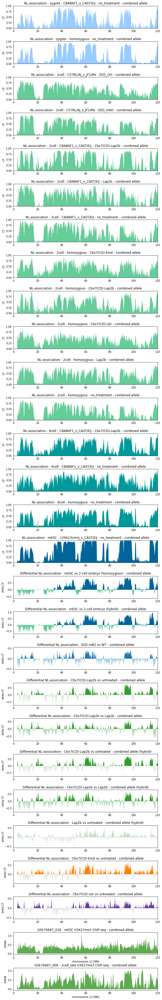

In [201]:
chrom = '12'
alleles = ['combined']
ext_samples = ['GSE76687_018', 'GSE76687_008']
fig, axes = plot_tracks_with_differential_signal(chrom, alleles, ext_samples=ext_samples)
plt.show()

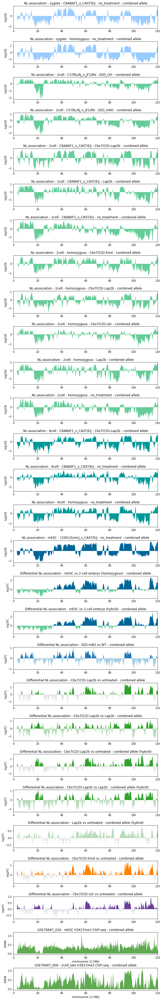

In [202]:
chrom = '12'
alleles = ['combined']
ext_samples = ['GSE76687_018', 'GSE76687_008']
fig, axes = plot_tracks_with_differential_signal(chrom, alleles, damid_vals='log2OE', ext_samples=ext_samples)
plt.show()

__chromosome 12 - parental alleles__

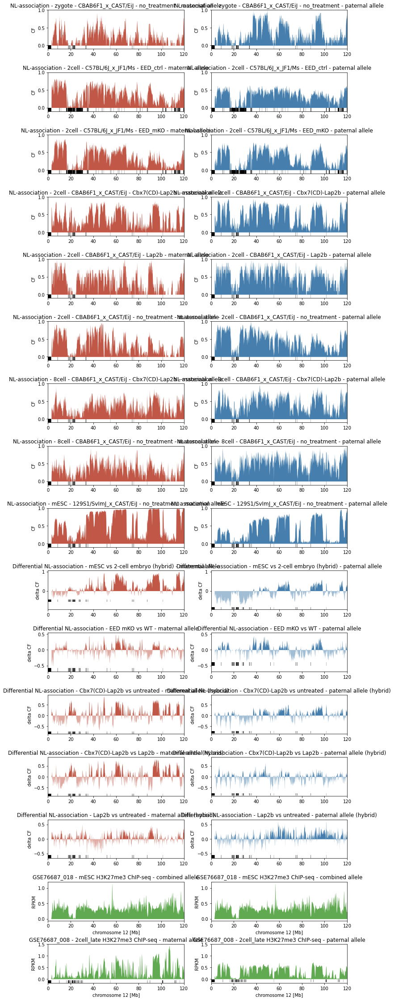

In [203]:
chrom = '12'
alleles = ['maternal', 'paternal']
ext_samples = ['GSE76687_018', 'GSE76687_008']
fig, axes = plot_tracks_with_differential_signal(chrom, alleles, ext_samples=ext_samples, figw=6)
plt.show()

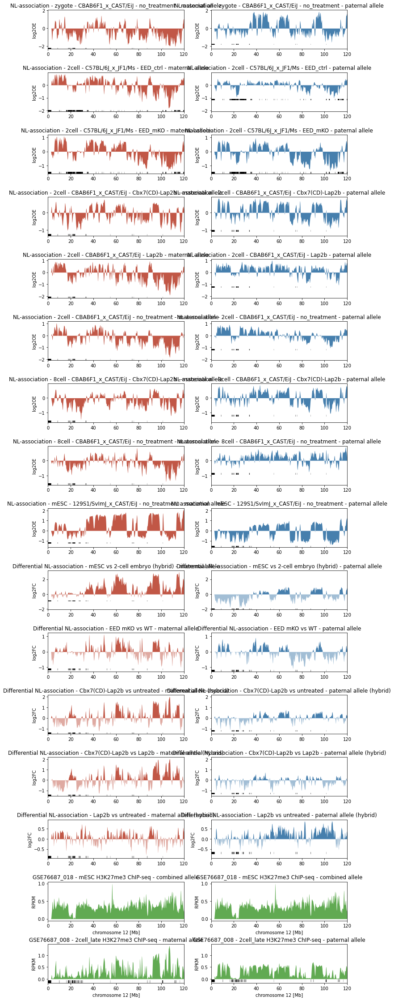

In [204]:
chrom = '12'
alleles = ['maternal', 'paternal']
ext_samples = ['GSE76687_018', 'GSE76687_008']

fig, axes = plot_tracks_with_differential_signal(
    chrom, alleles, damid_vals='log2OE', ext_samples=ext_samples, 
    figw=6, smooth_std=200000
)
plt.show()

__Chromosome 12 85-105Mb - all alleles__

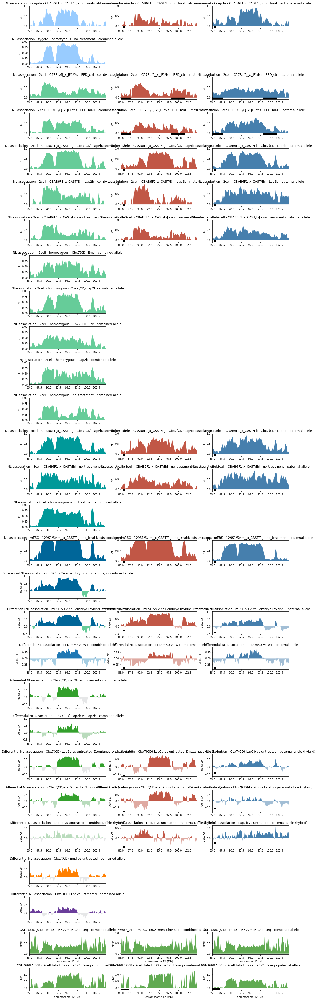

In [205]:
chrom = '12'
alleles = ['combined', 'maternal', 'paternal']
ext_samples = ['GSE76687_018', 'GSE76687_008']
fig, axes = plot_tracks_with_differential_signal(
    chrom, alleles, interval=[85e6, 105e6], 
    ext_samples=ext_samples, smooth_std=0,
    figw=6)
plt.show()

__Save plots for all chromosomes__

In [206]:
ext_samples = ['GSE76687_006', 'GSE76687_008', 'GSE76687_009', 'GSE76687_018']
smooth_std = 200000

for chrom in tqdm(chrom_order):
    
    figw = 10 * len(mapab[chrom]) / len(mapab['1'])
    
    for damid_vals in ['CF', 'log2OE']:

        # plot combined alleles
        alleles = ['combined']
        fig, axes = plot_tracks_with_differential_signal(
            chrom, alleles, damid_vals, [], ext_samples, figw=figw, smooth_std=smooth_std
        )
        outfn = FIGOUTDIR + 'example_track.all_conditions.whole_chr%s.combined_alleles.%s_values.pdf' % (chrom, damid_vals)
        plt.savefig(outfn, bbox_inches='tight')
        plt.close()

        # plot parental alleles
        alleles = ['maternal', 'paternal']
        fig, axes = plot_tracks_with_differential_signal(
            chrom, alleles, damid_vals, [], ext_samples, figw=figw, smooth_std=smooth_std
        )
        outfn = FIGOUTDIR + 'example_track.all_conditions.whole_chr%s.split_alleles.%s_values.pdf' % (chrom, damid_vals)
        plt.savefig(outfn, bbox_inches='tight')
        plt.close()

  0%|          | 0/21 [00:00<?, ?it/s]

__Save plots for regions of interest__

In [207]:
regions_of_interest = [
    ['1', [130e6, 160e6]],
    ['2', [5e6, 20e6]],
    ['2', [50e6, 75e6]],
    ['3', [65e6, 85e6]],
    ['3', [110e6, 130e6]],
    ['5', [35e6, 60e6]],
    ['6', [25e6, 40e6]],
    ['7', [80e6, 100e6]],
    ['7', [130e6, 145e6]],
    ['8', [45e6, 65e6]],
    ['10', [95e6, 120e6]],
    ['12', [85e6, 105e6]],
    ['12', [30e6, 55e6]],
    ['16', [18e6, 38e6]],
    ['17', [47e6, 67e6]],
    ['18', [68e6, 88e6]],
    ['18', [35e6, 60e6]],
    ['19', [5e6, 25e6]]
    
]

In [208]:
ext_samples = ['GSE76687_006', 'GSE76687_008', 'GSE76687_009', 'GSE76687_018']

for region in tqdm(regions_of_interest):
    
    chrom = region[0]
    interval = region[1]
    size = interval[1] - interval[0]
    
    figw = 0.2 * size / 1e6
    
    for damid_vals in ['CF', 'log2OE']:

        # plot combined alleles
        alleles = ['combined']

        fig, axes = plot_tracks_with_differential_signal(
            chrom, alleles, damid_vals, interval, ext_samples, figw=figw, smooth_std=0
        )

        outfn = FIGOUTDIR + 'example_track.all_conditions.chr%s_%d_%d.combined_alleles.%s_values.pdf' % (chrom, int(interval[0]), int(interval[1]), damid_vals)
        plt.savefig(outfn, bbox_inches='tight')
        plt.close()

        # plot parental alleles
        alleles = ['maternal', 'paternal']
        fig, axes = plot_tracks_with_differential_signal(
            chrom, alleles, damid_vals, interval, ext_samples, figw=figw, smooth_std=0
        )

        outfn = FIGOUTDIR + 'example_track.all_conditions.chr%s_%d_%d.split_alleles.%s_values.pdf' % (chrom, int(interval[0]), int(interval[1]), damid_vals)
        plt.savefig(outfn, bbox_inches='tight')
        plt.close()

  0%|          | 0/18 [00:00<?, ?it/s]

# 7. Contact Frequency distributions

## 7.1 CF distributions of different stages and treatments

__Overall Contact Frequency distributions__

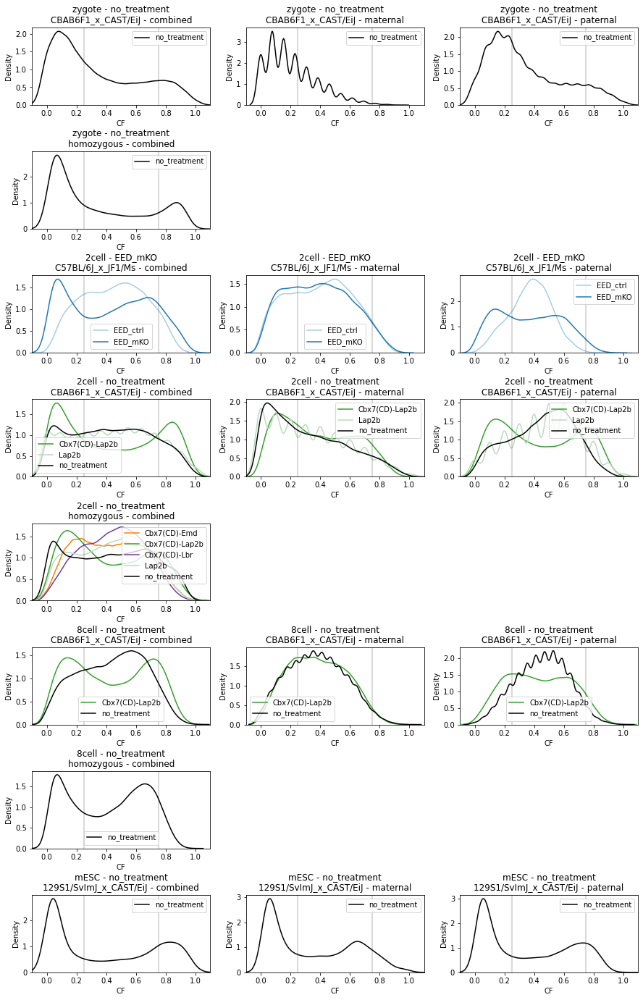

In [209]:
g_anno = anno_comb[~anno_comb.stage.isin(['early_blastocyst', 'morula'])].groupby(['stage', 'genotype'])

nrow = len(list(g_anno))
ncol = 3

fig, axes = plt.subplots(nrow, ncol, figsize=(15, 3*nrow))
plt.subplots_adjust(hspace=.6)
irow = 0

mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
al_filt = np.concatenate([allele_filt_total[c] for c in chrom_order[:-2]])

for (stage, genotype), df in g_anno:
    
    for icol, parent in enumerate(['combined', 'maternal', 'paternal']):

        ax = axes[irow,icol]
        
        if (genotype not in GENOTYPE2PARENT) and (parent != 'combined'):
            ax.remove()
            continue

        for treatment in df.treatment.unique():
        
            sample = (stage, genotype, treatment)
            X = np.concatenate([contact_freq[parent][sample][c] for c in chrom_order[:-2]])
            clr = color_dict['treatment'][treatment]
            clr = 'k' if treatment == 'no_treatment' else clr
            sns.kdeplot(
                X[mapab_filt & al_filt], 
                ax=ax, label = treatment,
                color=clr
            )

            ax.set_xlabel('CF')
            ax.set_title('%s - %s\n%s - %s' % (sample[0], sample[2], sample[1], parent))
            ax.set_xlim(-.1, 1.1)
            
        ax.legend()
        ax.axvline(.25, c='k', alpha=.2)
        ax.axvline(.75, c='k', alpha=.2)
            
        
    irow += 1

__Contact Frequency distributions in PADs and outside PADs__

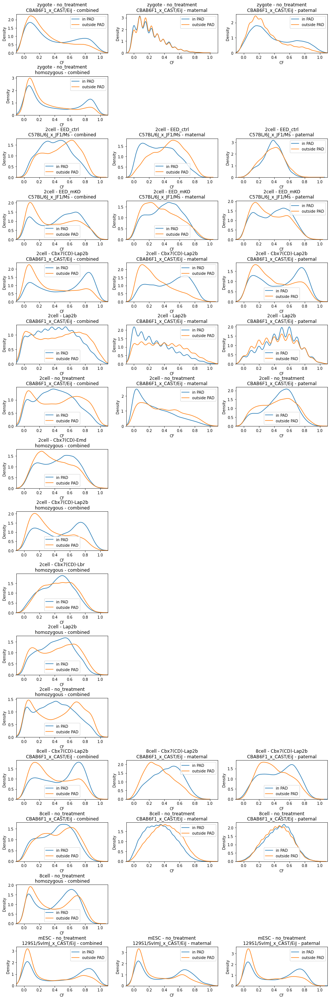

In [210]:
g_anno = anno_comb[~anno_comb.stage.isin(['early_blastocyst', 'morula'])].groupby(['stage', 'genotype', 'treatment'])

nrow = len(list(g_anno))
ncol = 3

fig, axes = plt.subplots(nrow, ncol, figsize=(15, 3*nrow))
plt.subplots_adjust(hspace=.6)
irow = 0

mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
al_filt = np.concatenate([allele_filt_total[c] for c in chrom_order[:-2]])
filt = mapab_filt & al_filt
is_pad = np.concatenate([pad_density[c] for c in chrom_order[:-2]])[filt] > 0

for (stage, genotype, treatment), df in g_anno:
    
    for icol, parent in enumerate(['combined', 'maternal', 'paternal']):

        ax = axes[irow,icol]
        
        if (genotype not in GENOTYPE2PARENT) and (parent != 'combined'):
            ax.remove()
            continue
        
        sample = (stage, genotype, treatment)
        X = np.concatenate([contact_freq[parent][sample][c] for c in chrom_order[:-2]])
        X = X[filt]

        sns.kdeplot(
            X[is_pad], 
            ax=ax, label = 'in PAD'
        )
        
        sns.kdeplot(X[~is_pad], ax=ax, label = 'outside PAD')

        ax.set_xlabel('CF')
        ax.set_title('%s - %s\n%s - %s' % (sample[0], sample[2], sample[1], parent))
        ax.set_xlim(-.1, 1.1)
            
        ax.legend()
            
        
    irow += 1

## 7.2 Comparing CF distributions as violins

### Collecting CF values and metadata

__Computing contact variance per bin__

In [211]:
damid_var = dict()

for parent in ['combined', 'maternal', 'paternal']:
    damid_var[parent] = dict()
    
    for info, df in anno.groupby(['stage', 'genotype', 'treatment']):
        
        if info not in damid_insilico[parent]:
            continue
        
        damid_var[parent][info] = dict()
        
        ind = df.DamID_PASS if parent == 'combined' else df.DamID_PASS_allelic
        samples = df[ind].index.values
        
        for chrom in chrom_order:
            
            Y = list()
            for sample in samples:
                Y.append(damid_binary[parent][sample][chrom])
            Y = np.array(Y)
            
            damid_var[parent][info][chrom] = np.var(Y, axis=0)

__Generating a dataframe with all info - only data from somatic chromosomes are included__

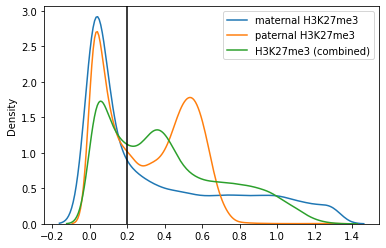

In [212]:
from collections import defaultdict

mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
al_filt = np.concatenate([allele_filt_total[c] for c in chrom_order[:-2]])
ext_sample = 'GSE76687_008'

to_plot_all = dict()

a = np.concatenate([pad_density[c] for c in chrom_order[:-2]])[mapab_filt & al_filt]

k27vals = dict()
for parent in ['combined', 'maternal', 'paternal']:
    filt = mapab_filt & al_filt
    Y = np.concatenate([ext_data[parent][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])[filt]
    vis = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])[filt]
    
    if parent != 'combined':
        ind = (vis == 0) | np.isnan(vis) | np.isinf(vis)
        vis[ind] = 1
        Y = Y / vis
    
    k27vals[parent] = Y

fig, ax = plt.subplots()
sns.kdeplot(k27vals['maternal'].clip(0,1.3), label='maternal H3K27me3')
sns.kdeplot(k27vals['paternal'].clip(0,1.3), label='paternal H3K27me3')
sns.kdeplot(k27vals['combined'].clip(0,1.3), label='H3K27me3 (combined)')
ax.axvline(0.2, c='k')
ax.legend()
plt.show()
plt.close()

for irow, parent in enumerate(['combined', 'maternal', 'paternal']):
    ax = axes[irow]
    
    ind = (anno_comb.is_heterozygous & anno_comb.is_singlecell) if parent != 'combined' else anno_comb.is_singlecell
    annotmp = anno_comb[ind].copy()
    
    to_plot = defaultdict(list)
    
    for _, row in annotmp.iterrows():
        sample = (row['stage'], row['genotype'], row['treatment'])
        cf = np.concatenate([contact_freq[parent][sample][c] for c in chrom_order[:-2]])[mapab_filt & al_filt]
        var = np.concatenate([damid_var[parent][sample][c] for c in chrom_order[:-2]])[mapab_filt & al_filt]
        to_plot['stage'].append(np.repeat(row['stage'], len(cf)))
        to_plot['genotype'].append(np.repeat(row['genotype'], len(cf)))
        to_plot['treatment'].append(np.repeat(row['treatment'], len(cf)))
        to_plot['CF'].append(cf)
        to_plot['contact_variance'].append(var)
        to_plot['PAD_density'].append(a)
        to_plot['H3K27me3_maternal'].append(k27vals['maternal'])
        to_plot['H3K27me3_paternal'].append(k27vals['paternal'])
        
        k27cat = (k27vals[parent] // 0.2) * 0.2
        k27cat = np.round(k27cat.clip(0,1), 1) 
        to_plot['H3K27me3_cat'].append(k27cat)
        
    for k in to_plot:
        to_plot[k] = np.concatenate(to_plot[k])
    to_plot_all[parent] = pd.DataFrame(to_plot)
    

In [213]:
damid_var['maternal'].keys()

dict_keys([('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl'), ('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('8cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b'), ('8cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment'), ('zygote', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')])

__Contact Frequency per stage/treatment/allele__

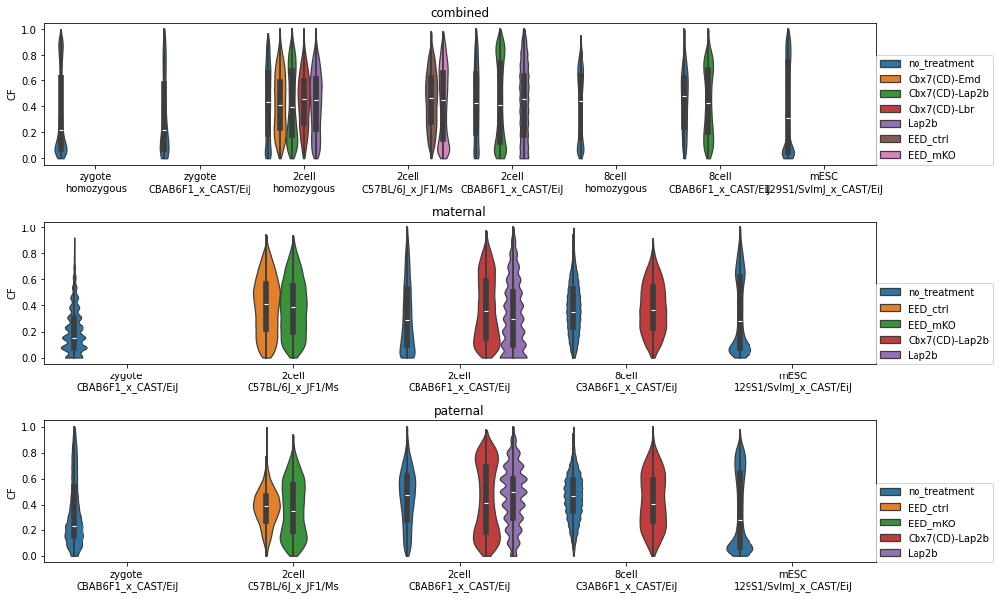

In [214]:
fig, axes = plt.subplots(3,1,figsize=(15,10))
plt.subplots_adjust(hspace=.4)

for irow, parent in enumerate(['combined', 'maternal', 'paternal']):
    ax = axes[irow]
    
    to_plot = to_plot_all[parent].copy()
    to_plot['stage'] = pd.Categorical(to_plot['stage'], categories=['zygote', '2cell', '8cell', 'mESC'])
    to_plot['label'] = to_plot.apply(axis=1, func = lambda r: '%s\n%s' % (r['stage'], r['genotype']))
    o = to_plot.sort_values(by=['stage', 'genotype', 'treatment'])['label'].unique()
    
    sns.violinplot(x=to_plot['label'], y=to_plot['CF'], hue=to_plot['treatment'], ax=ax, cut=0)
    ax.set_title(parent)
    ax.legend(loc=(1,0))
    ax.set_ylim(-.05, 1.05)
    ax.set_xlabel('')

__Contact Frequency per allele for all conditions__

Text(0.5, 0, '')

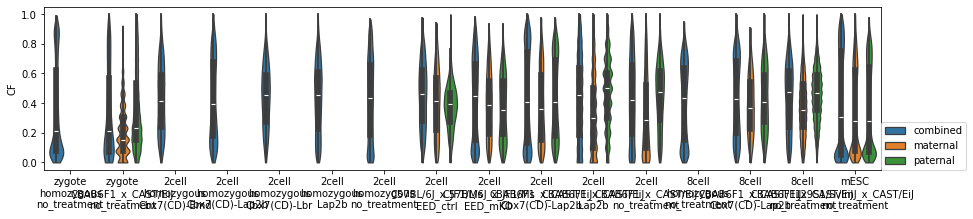

In [215]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
to_plot = pd.concat(to_plot, axis=0)

fig, ax = plt.subplots(1,1,figsize=(15,3))

to_plot['stage'] = pd.Categorical(to_plot['stage'], categories=['zygote', '2cell', '8cell', 'mESC'])
to_plot['label'] = to_plot.apply(axis=1, func = lambda r: '%s\n%s\n%s' % (r['stage'], r['genotype'], r['treatment']))
o = to_plot.sort_values(by=['stage', 'genotype', 'treatment'])['label'].unique()

sns.violinplot(x=to_plot['label'], y=to_plot['CF'], hue=to_plot['allele'], ax=ax, cut=0)
ax.legend(loc=(1,0))
ax.set_ylim(-.05, 1.05)
ax.set_xlabel('')

__Contact Frequency per allele, split on genomic enrichment of H3K27me3 in the 2-cell embryo__

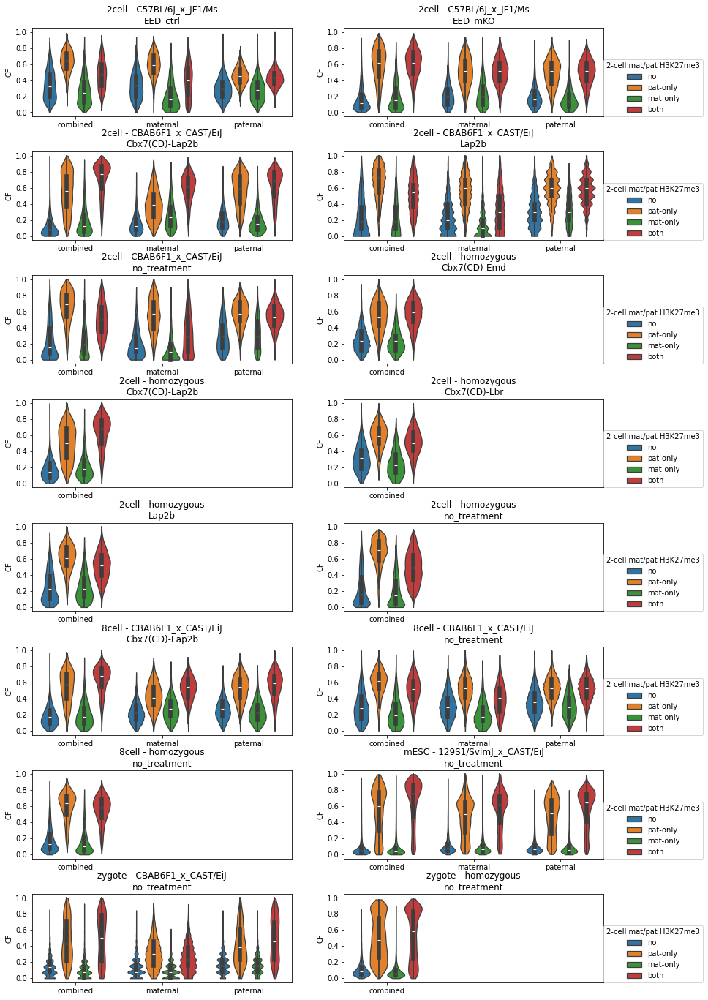

In [216]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
to_plot = pd.concat(to_plot, axis=0)
# to_plot['H3K27me3'] = to_plot[['H3K27me3_maternal', 'H3K27me3_paternal']].max(axis=1) > 0.3
to_plot['H3K27me3'] = 'no'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal < 0.2), 'H3K27me3'] = 'mat-only'
to_plot.loc[(to_plot.H3K27me3_maternal < 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'pat-only'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'both'

# to_plot['H3K27me3'] = to_plot['PAD_density'] > 0

g_to_plot = to_plot.groupby(['stage', 'genotype', 'treatment'])
ncol = 2
nplot = len(list(g_to_plot))
nrow = int(np.ceil(nplot/ncol))

fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*7,3*nrow))
plt.subplots_adjust(hspace=.4)
counter = 0

for info, df in g_to_plot:
    
    ax = axes.flatten()[counter]
    counter += 1
    
#     print(df.groupby('H3K27me3').size())

    ax.set_title('%s - %s\n%s' % info)
    
    sns.violinplot(
        x=df['allele'], y=df['CF'], hue=df['H3K27me3'], 
        ax=ax, cut=0, hue_order=['no', 'pat-only', 'mat-only', 'both']
    )
    
    if counter % 2 == 0:
        ax.legend(loc=(1,0), title='2-cell mat/pat H3K27me3')
    else:
        ax.legend_.remove()
    ax.set_ylim(-.05, 1.05)
    ax.set_xlabel('')
    
xrange = np.array([ax.get_xlim() for ax in axes.flatten()])
xmin = xrange.min(axis=0)[0]
xmax = xrange.max(axis=0)[1]
for ax in axes.flatten():
    ax.set_xlim(xmin, xmax)
    
outfn = FIGOUTDIR + 'CF_distribution_in_regions_with_and_without_2cell_H3K27me3.split_by_allele.version1.pdf'
plt.savefig(outfn, bbox_inches='tight')

__Contact Frequency per allele, split on genomic enrichment of H3K27me3 in the 2-cell embryo - version 2__

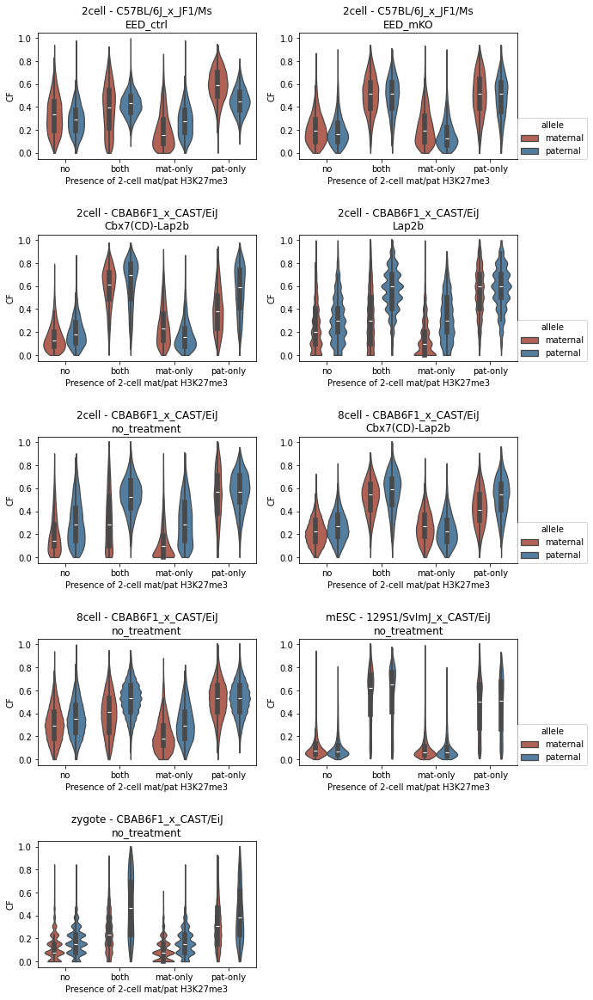

In [217]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
    
to_plot = pd.concat(to_plot, axis=0)
to_plot = to_plot[to_plot.allele.isin(['maternal', 'paternal'])]
# to_plot['H3K27me3'] = to_plot[['H3K27me3_maternal', 'H3K27me3_paternal']].max(axis=1) > 0.3
to_plot['H3K27me3'] = 'no'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal < 0.2), 'H3K27me3'] = 'mat-only'
to_plot.loc[(to_plot.H3K27me3_maternal < 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'pat-only'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'both'

# to_plot['H3K27me3'] = to_plot['PAD_density'] > 0

g_to_plot = to_plot.groupby(['stage', 'genotype', 'treatment'])
ncol = 2
nplot = len(list(g_to_plot))
nrow = int(np.ceil(nplot/ncol))

fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*5,4*nrow))
plt.subplots_adjust(hspace=.6)
counter = 0

for info, df in g_to_plot:
    
    ax = axes.flatten()[counter]
    counter += 1
    
#     print(df.groupby('H3K27me3').size())

    ax.set_title('%s - %s\n%s' % info)
    
    sns.violinplot(
        x=df['H3K27me3'], y=df['CF'], hue=df['allele'], 
        ax=ax, cut=0, hue_order=['maternal', 'paternal'], palette=color_dict['allele'],
        order = ['no', 'both', 'mat-only', 'pat-only']
    )
    
    if counter % 2 == 0:
        ax.legend(loc=(1,0), title='allele')
    else:
        ax.legend_.remove()
    ax.set_ylim(-.05, 1.05)
    ax.set_xlabel('Presence of 2-cell mat/pat H3K27me3')
    
while counter < (nrow*ncol):
    axes.flatten()[counter].remove()
    counter += 1
    
xrange = np.array([ax.get_xlim() for ax in axes.flatten()])
xmin = xrange.min(axis=0)[0]
xmax = xrange.max(axis=0)[1]
for ax in axes.flatten():
    ax.set_xlim(xmin, xmax)
    
outfn = FIGOUTDIR + 'CF_distribution_in_regions_with_and_without_2cell_H3K27me3.split_by_allele.version2.pdf'
plt.savefig(outfn, bbox_inches='tight')

__Contact Frequency per allele, split on genomic enrichment of H3K27me3 in the 2-cell embryo - comparison of EED mKO and WT__

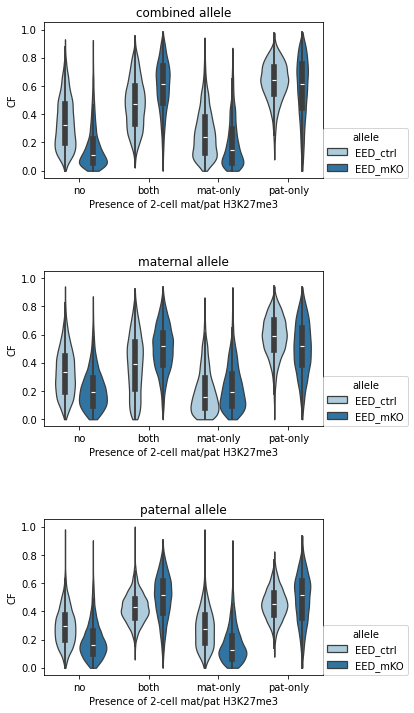

In [218]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
    
to_plot = pd.concat(to_plot, axis=0)
to_plot = to_plot[to_plot.genotype=='C57BL/6J_x_JF1/Ms']
to_plot = to_plot[to_plot.stage=='2cell']
to_plot['H3K27me3'] = 'no'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal < 0.2), 'H3K27me3'] = 'mat-only'
to_plot.loc[(to_plot.H3K27me3_maternal < 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'pat-only'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'both'

assert len(to_plot.genotype.unique()) == 1
assert len(to_plot.stage.unique()) == 1

g_to_plot = to_plot.groupby(['allele'])
nrow = len(g_to_plot)
ncol = 1

fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*5,4*nrow))
plt.subplots_adjust(hspace=.6)
counter = 0

for allele, df in g_to_plot:
    
    ax = axes.flatten()[counter]
    counter += 1
    
    ax.set_title('%s allele' % allele)
    
    sns.violinplot(
        x=df['H3K27me3'], y=df['CF'], hue=df['treatment'], 
        ax=ax, cut=0, palette=color_dict['treatment'],
        hue_order = ['EED_ctrl', 'EED_mKO'],
        order = ['no', 'both', 'mat-only', 'pat-only']
    )
    
    ax.legend(loc=(1,0), title='allele')
    ax.set_ylim(-.05, 1.05)
    ax.set_xlabel('Presence of 2-cell mat/pat H3K27me3')
    
outfn = FIGOUTDIR + 'CF_distribution_in_regions_with_and_without_2cell_H3K27me3.split_by_allele.EED_mKO_vs_WT.pdf'
plt.savefig(outfn, bbox_inches='tight')

__Contact Frequency per allele, split on genomic enrichment of H3K27me3 in the 2-cell embryo - comparison of tethering vs untreated__

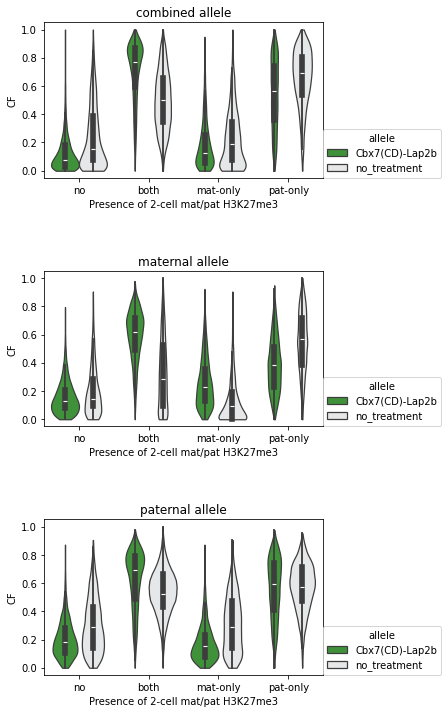

In [219]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
    
to_plot = pd.concat(to_plot, axis=0)
to_plot = to_plot[(to_plot.genotype=='CBAB6F1_x_CAST/EiJ') & to_plot.treatment.isin(['Cbx7(CD)-Lap2b', 'no_treatment'])]
to_plot = to_plot[to_plot.stage=='2cell']
to_plot['H3K27me3'] = 'no'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal < 0.2), 'H3K27me3'] = 'mat-only'
to_plot.loc[(to_plot.H3K27me3_maternal < 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'pat-only'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'both'

assert len(to_plot.genotype.unique()) == 1
assert len(to_plot.stage.unique()) == 1

g_to_plot = to_plot.groupby(['allele'])
nrow = len(g_to_plot)
ncol = 1

fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*5,4*nrow))
plt.subplots_adjust(hspace=.6)
counter = 0

for allele, df in g_to_plot:
    
    ax = axes.flatten()[counter]
    counter += 1
    
    ax.set_title('%s allele' % allele)
    
    sns.violinplot(
        x=df['H3K27me3'], y=df['CF'], hue=df['treatment'], 
        ax=ax, cut=0, palette=color_dict['treatment'],
        order = ['no', 'both', 'mat-only', 'pat-only']
    )
    
    ax.legend(loc=(1,0), title='allele')
    ax.set_ylim(-.05, 1.05)
    ax.set_xlabel('Presence of 2-cell mat/pat H3K27me3')
    
outfn = FIGOUTDIR + 'CF_distribution_in_regions_with_and_without_2cell_H3K27me3.split_by_allele.Cbx7-Lap2b_vs_untreated.pdf'
plt.savefig(outfn, bbox_inches='tight')

__Saving statistical test results__

In [220]:
import itertools

In [221]:
to_plot = list()
for parent in to_plot_all:
    df = to_plot_all[parent].copy()
    df['allele'] = parent
    to_plot.append(df)
    
to_plot = pd.concat(to_plot, axis=0)
to_plot = to_plot[to_plot.stage=='2cell']
to_plot['H3K27me3'] = 'no'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal < 0.2), 'H3K27me3'] = 'mat-only'
to_plot.loc[(to_plot.H3K27me3_maternal < 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'pat-only'
to_plot.loc[(to_plot.H3K27me3_maternal > 0.2) & (to_plot.H3K27me3_paternal > 0.2), 'H3K27me3'] = 'both'

In [222]:
stat_results = defaultdict(list)

for (stage, genotype, treatment, allele), subdf in to_plot.groupby(['stage', 'genotype', 'treatment', 'allele']):
    
    groups = itertools.combinations(subdf['H3K27me3'].sort_values().unique(), 2)
    
    for g1, g2 in groups:
        
        A = subdf.loc[subdf['H3K27me3']==g1,'CF'].values
        B = subdf.loc[subdf['H3K27me3']==g2,'CF'].values
        
        result = stats.ranksums(A, B, alternative='two-sided')

        stat_results['stage'].append(stage)
        stat_results['genotype'].append(genotype)
        stat_results['treatment'].append(treatment)
        stat_results['allele'].append(allele)
        stat_results['group_1'].append(g1)
        stat_results['group_2'].append(g2)
        stat_results['wilcox_stat'].append(result[0])
        stat_results['wilcox_pval'].append(result[1])
        stat_results['n_group_1'].append(len(A))
        stat_results['n_group_2'].append(len(B))
        stat_results['mean_group_1'].append(A.mean())
        stat_results['mean_group_2'].append(B.mean())
        stat_results['median_group_1'].append(np.median(A))
        stat_results['median_group_2'].append(np.median(B))
        stat_results['std_group_1'].append(np.std(A))
        stat_results['std_group_2'].append(np.std(B))
        
stat_results = pd.DataFrame(stat_results)

outfn = FIGOUTDIR + 'statistical_test_results.CF_distribution_comparison_between_different_H3K27me3_groups.per_condition.per_allele.tsv'
stat_results.to_csv(outfn, header=True, index=False, sep='\t')

In [223]:
stat_results = defaultdict(list)

for (stage, genotype, treatment, group), subdf in to_plot.groupby(['stage', 'genotype', 'treatment', 'H3K27me3']):

    A = subdf.loc[subdf['allele']=='maternal','CF'].values
    B = subdf.loc[subdf['allele']=='paternal','CF'].values
    
    if (len(A) == 0) or (len(B) == 0):
        continue

    result = stats.ranksums(A, B, alternative='two-sided')

    stat_results['stage'].append(stage)
    stat_results['genotype'].append(genotype)
    stat_results['treatment'].append(treatment)
    stat_results['genomic_region'].append(group)
    stat_results['wilcox_stat'].append(result[0])
    stat_results['wilcox_pval'].append(result[1])
    stat_results['n_mat'].append(len(A))
    stat_results['n_pat'].append(len(B))
    stat_results['mean_mat'].append(A.mean())
    stat_results['mean_pat'].append(B.mean())
    stat_results['median_mat'].append(np.median(A))
    stat_results['median_pat'].append(np.median(B))
    stat_results['std_mat'].append(np.std(A))
    stat_results['std_pat'].append(np.std(B))
        
stat_results = pd.DataFrame(stat_results)

outfn = FIGOUTDIR + 'statistical_test_results.CF_distribution_comparison_between_maternal_and_paternal_allele.per_condition.per_genomic_region.tsv'
stat_results.to_csv(outfn, header=True, index=False, sep='\t')

In [224]:
stat_results = defaultdict(list)

comparisons = [
    ('EED_ctrl', 'EED_mKO'),
    ('Cbx7(CD)-Lap2b', 'no_treatment'),
    ('Cbx7(CD)-Lap2b', 'Lap2b'),
    ('Cbx7(CD)-Emd', 'no_treatment'),
    ('Cbx7(CD)-Lbr', 'no_treatment')
]

for (stage, genotype, allele, group), subdf in to_plot.groupby(['stage', 'genotype', 'allele', 'H3K27me3']):

    for t1, t2 in comparisons:
    
        A = subdf.loc[subdf['treatment']==t1,'CF'].values
        B = subdf.loc[subdf['treatment']==t2,'CF'].values
        
        if (len(A) == 0) or (len(B) == 0):
            continue

        result = stats.ranksums(A, B, alternative='two-sided')

        stat_results['stage'].append(stage)
        stat_results['genotype'].append(genotype)
        stat_results['allele'].append(allele)
        stat_results['genomic_region'].append(group)
        stat_results['group_1'].append(t1)
        stat_results['group_2'].append(t2)
        stat_results['wilcox_stat'].append(result[0])
        stat_results['wilcox_pval'].append(result[1])
        stat_results['n_group_1'].append(len(A))
        stat_results['n_group_2'].append(len(B))
        stat_results['mean_group_1'].append(A.mean())
        stat_results['mean_group_2'].append(B.mean())
        stat_results['median_group_1'].append(np.median(A))
        stat_results['median_group_2'].append(np.median(B))
        stat_results['std_group_1'].append(np.std(A))
        stat_results['std_group_2'].append(np.std(B))
        
stat_results = pd.DataFrame(stat_results)

outfn = FIGOUTDIR + 'statistical_test_results.CF_distribution_comparison_between_treatments.per_allele.per_genomic_region.tsv'
stat_results.to_csv(outfn, header=True, index=False, sep='\t')

# 8. Genome-wide comparison of EED mKO vs WT CF

## 8.1 Function to make hexbin plots

In [35]:
def infer_optimal_gridsize_for_CF(condition1, condition2, allele):
    
    # determine number of samples per condition
    ind1 = (anno['stage'] == condition1[0]) & (anno['genotype'] == condition1[1]) & (anno['treatment'] == condition1[2])
    n1 = (ind1 & anno.DamID_PASS).sum() if allele == 'combined' else (ind1 & anno.DamID_PASS_allelic).sum()
    ind2 = (anno['stage'] == condition2[0]) & (anno['genotype'] == condition2[1]) & (anno['treatment'] == condition2[2])
    n2 = (ind2 & anno.DamID_PASS).sum() if allele == 'combined' else (ind2 & anno.DamID_PASS_allelic).sum()

    # determine optimal gridsize
    n = min(n1,n2)+1
    N = max(n1,n2)+1
    for i in range(n,0,-1):
        res = (N / i) % 1
        allowance = 1/i
        if (res <= allowance) :
#                 print(N, n, i, N/i, res, allowance)
            gridsize = i
            break
#             print(n1, n2, gridsize)
    gridsize = min(gridsize,50)
    gridsize = max(gridsize,15)
    
    return gridsize

In [36]:
def hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, clrlab, filt_ind, cmap='viridis', clrrange=[], gridsize=0):

    if (condition1[1] in GENOTYPE2PARENT) and (condition2[1] in GENOTYPE2PARENT):
        parents = ['combined', 'maternal', 'paternal']
    else:
        parents = ['combined']
        
    metric = 'log2OE' if metric != 'CF' else 'CF'
        
    ncol = len(parents)
    figw = ncol * 4 * 1.5 if ncol > 1 else 4
    fig, axes = plt.subplots(1,ncol,figsize=(figw,5))
    plt.subplots_adjust(wspace=.5)

    diff = np.array(condition1) != np.array(condition2)
    xlab = ' - '.join(np.array(condition1)[diff]) + ' [%s]' % metric
    ylab = ' - '.join(np.array(condition2)[diff]) + ' [%s]' % metric
    
    infer_gridsize = (gridsize == 0) and (metric == 'CF')
    gridsize = 50 if (not infer_gridsize) and (gridsize == 0) else gridsize

    for icol, parent in enumerate(parents):

        # determine ideal gridsize
        if infer_gridsize:
            gridsize = infer_optimal_gridsize_for_CF(condition1, condition2, parent)

        # select data
        if metric == 'CF':
            X = np.concatenate([contact_freq[parent][condition1][c] for c in chrom_order[:-2]])[filt_ind]
            Y = np.concatenate([contact_freq[parent][condition2][c] for c in chrom_order[:-2]])[filt_ind]
            extent = [0,1,0,1]
        else:
            X = np.concatenate([damid_insilico_logoe[parent][condition1][c] for c in chrom_order[:-2]])[filt_ind]
            Y = np.concatenate([damid_insilico_logoe[parent][condition2][c] for c in chrom_order[:-2]])[filt_ind]
            a = np.percentile(X, [0.1, 99.9])
            b = np.percentile(Y, [0.1, 99.9])
            x = min(a[0], b[0])
            y = max(a[1], b[1])
            extent = [x,y,x,y]


        if parent in colorvals:
            C = colorvals[parent][filt_ind]
            add_label = ' - %s' % parent
        elif 'combined' in colorvals:
            C = colorvals['combined'][filt_ind]
            add_label = ' - combined'
        elif len(colorvals) == 0:
            C = []
            add_label = ''
        else:
            C = colorvals[filt_ind]
            add_label = ''

        ax = axes[icol] if ncol > 1 else axes

        # if no data is provided for bin information, plot bin density
        if len(colorvals) == 0:

            if len(clrrange) == 0:
                p = ax.hexbin(
                    X, Y, 
                    extent=extent, gridsize=gridsize, 
                    bins='log', cmap=cmap, mincnt=1
                )

            else:
                p = ax.hexbin(
                    X, Y, 
                    extent=extent, gridsize=gridsize, 
                    bins='log', cmap=cmap, mincnt=1, 
                    vmin=clrrange[0], vmax=clrrange[1]
                )
        # if data is provided for bin information, plot average in hexplot
        else:

            if len(clrrange) == 0:
                p = ax.hexbin(X, Y, C, 
                              extent=extent, gridsize=gridsize, 
                              cmap=cmap, mincnt=1)
                clim = np.array(p.get_clim())
                if clim[0] < 0:
                    new_clim = [-max(abs(clim)), max(abs(clim))]
                    
                    p.remove()
                    p = ax.hexbin(X, Y, C, 
                                  extent=extent, gridsize=gridsize, 
                                  cmap=cmap, mincnt=1, vmin=new_clim[0], vmax=new_clim[1])
            else:
                p = ax.hexbin(X, Y, C, 
                              extent=extent, gridsize=gridsize, 
                              cmap=cmap, mincnt=1,
                              vmin=clrrange[0], vmax=clrrange[1]
                             )

        cbar = plt.colorbar(p, ax=ax, shrink=0.5)
        cbar.ax.set_ylabel(clrlab + add_label)

        ax.plot([extent[0], extent[1]], [extent[0], extent[1]], c='k', ls=':')
        ax.set_title(parent)
        ax.set_xlim(extent[0], extent[1])
        ax.set_ylim(extent[0], extent[1])
        ax.set_aspect('equal')
        ax.set_xlabel(xlab)
        ax.set_ylabel(ylab)

        r, p = stats.spearmanr(X, Y)
        ax.text(0.02, 0.98, 'rho = %.2f\np = %.2e\nn = %d' % (r, p, len(X)), va='top', transform=ax.transAxes)
        
        

## 8.2 Collect data for plotting

### Samples to plot against each other

In [37]:
condition_comparisons = {
    'EED_mKO_vs_ctrl': [
        ('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl'), ('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_mKO')
    ],
    
    'Peters_vs_Kind': [
        ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('2cell', 'C57BL/6J_x_JF1/Ms', 'EED_ctrl')
    ],
    
    'mESC_vs_2cell_hybrid': [
        ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment')
    ],
    
    'mESC_vs_2cell_homozygous': [
        ('2cell', 'homozygous', 'no_treatment'), ('mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment')
    ],
    
    '2cell_vs_zygote_hybrid': [
        ('zygote', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment')
    ],
    
    '2cell_vs_zygote_homozygous': [
        ('zygote', 'homozygous', 'no_treatment'), ('2cell', 'homozygous', 'no_treatment')
    ],
    
    'Cbx7(CD)-Lap2b_vs_untreated_homozygous': [
        ('2cell', 'homozygous', 'no_treatment'), ('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
    ],
    
    'Cbx7(CD)-Lap2b_vs_Lap2b_homozygous': [
        ('2cell', 'homozygous', 'Lap2b'), ('2cell', 'homozygous', 'Cbx7(CD)-Lap2b')
    ],
    
    'Lap2b_vs_untreated_homozygous': [
        ('2cell', 'homozygous', 'no_treatment'), ('2cell', 'homozygous', 'Lap2b')
    ],
    
    'Cbx7(CD)-Lap2b_vs_untreated_hybrid': [
        ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b')
    ],
    
    'Cbx7(CD)-Lap2b_vs_Lap2b_hybrid': [
        ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b')
    ],
    
    'Lap2b_vs_untreated_hybrid': [
        ('2cell', 'CBAB6F1_x_CAST/EiJ', 'no_treatment'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b')
    ],
    
    'Cbx7(CD)-Lap2b_hybrid_vs_homozygous': [
        ('2cell', 'homozygous', 'Cbx7(CD)-Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Cbx7(CD)-Lap2b')
    ],
    
    'Lap2b_hybrid_vs_homozygous': [
        ('2cell', 'homozygous', 'Lap2b'), ('2cell', 'CBAB6F1_x_CAST/EiJ', 'Lap2b')
    ],
    
    'Cbx7(CD)-Emd_vs_untreated_homozygous': [
        ('2cell', 'homozygous', 'no_treatment'), ('2cell', 'homozygous', 'Cbx7(CD)-Emd')
    ],
    
    'Cbx7(CD)-Lbr_vs_untreated_homozygous': [
        ('2cell', 'homozygous', 'no_treatment'), ('2cell', 'homozygous', 'Cbx7(CD)-Lbr')
    ],
    
}

### Data to project onto hexbin

In [38]:
color_val_dict = dict()

# add bin density
color_val_dict['bin_density'] = []

# add external ChIP-seq samples
external_samples = ['GSE76687_008', 'GSE97778_025', 'GSE153496_006', 'GSE71434_008']
for ext_sample in external_samples:
    
    # determine name
    s = ext_anno.loc[ext_anno.sample_id==ext_sample,'stage'].values[0]
    m = ext_anno.loc[ext_anno.sample_id==ext_sample,'target'].values[0]
    name = '%s_%s_%s' % (s, m, ext_sample)
    color_val_dict[name] = dict()

    ## determine allele visibility for external sample
    if ext_sample in ext_data['allele_vis']:
        v = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
        v[np.isnan(v)] = 0
        v_filt = v > 0.2
        color_val_dict[name]['filt'] = v_filt
        
    ## identify control
    control = ext_anno.loc[ext_anno.sample_id==ext_sample,'control_id'].values[0]
        
    ## determine allele-specific signal
    for parent in ['combined', 'maternal', 'paternal']:
        if ext_sample in ext_data[parent]:
            
            C = np.concatenate([ext_data[parent][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
            
            if control != 'none':
                Ctrl = np.concatenate([ext_data[parent][control][c][:len(mapab[c])] for c in chrom_order[:-2]])
                C = np.log2((C + .1) / (Ctrl + .1))
                
            elif (ext_sample in ext_data['allele_vis']) and (parent != 'combined'):
                vis = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
                ind = (vis == 0) | np.isnan(vis) | np.isinf(vis)
                vis[ind] = 1
                C = C / vis
            
            color_val_dict[name][parent] = C
            
# add mESC CF
cond = 'mESC', '129S1/SvImJ_x_CAST/EiJ', 'no_treatment'
color_val_dict['mESC_CF'] = np.concatenate([contact_freq['combined'][cond][c] for c in chrom_order[:-2]])

# add PAD density
color_val_dict['PAD_density'] = np.concatenate([pad_density[c] for c in chrom_order[:-2]])

### Function to determine bin filtering

In [39]:
def determine_filt_for_hexbin(comparison, project_data):
    filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
    
    # determine genotype filtering if necessary
    gts = np.array([condition1[1], condition2[1]])
    plot_allelic = (gts[0] in GENOTYPE2PARENT) and (gts[1] in GENOTYPE2PARENT)
    if plot_allelic:
        al_filt = np.concatenate([allele_filt_gt[gts[0]][c] & allele_filt_gt[gts[1]][c] for c in chrom_order[:-2]])
        filt = filt & al_filt
    
    # determine external data allele visibility filtering if necessary
    if ('filt' in color_val_dict[project_data]) and plot_allelic:
        filt = filt & color_val_dict[project_data]['filt']

    return filt

## 8.3 Systematically plotting everything

In [230]:
for comparison in condition_comparisons.keys():
    
    for project_data in color_val_dict.keys():
        
        if project_data == 'bin_density':
            cmap = 'bone'
        elif 'H3K9me3' in project_data:
            cmap = 'PuOr'
        elif 'H3K27me3' in project_data:
            cmap = 'Greens'
        elif 'H3K4me3' in project_data:
            cmap = 'Blues'
        else:
            cmap = 'bone'
            
        if project_data in ['mESC_CF', 'PAD_density']:
            clrrange = [0,1]
        else:
            clrrange = []
            
        
        condition1, condition2 = condition_comparisons[comparison]
        colorvals = color_val_dict[project_data]
        filt = determine_filt_for_hexbin(comparison, project_data)
        
        for metric in ['CF', 'log2OE']:
            hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap=cmap, clrrange=clrrange)
            outfn = FIGOUTDIR + 'hexbin.comparison_of_%s.colored_by_%s.DamID_%s_values.pdf' % (comparison, project_data, metric)
            plt.savefig(outfn, bbox_inches='tight')
            plt.close()
            print((comparison, project_data, metric))

('EED_mKO_vs_ctrl', 'bin_density', 'CF')
('EED_mKO_vs_ctrl', 'bin_density', 'log2OE')
('EED_mKO_vs_ctrl', '2cell_late_H3K27me3_GSE76687_008', 'CF')
('EED_mKO_vs_ctrl', '2cell_late_H3K27me3_GSE76687_008', 'log2OE')
('EED_mKO_vs_ctrl', '2cell_late_H3K9me3_GSE97778_025', 'CF')
('EED_mKO_vs_ctrl', '2cell_late_H3K9me3_GSE97778_025', 'log2OE')
('EED_mKO_vs_ctrl', '2cell_late_H2AK119ub1_GSE153496_006', 'CF')
('EED_mKO_vs_ctrl', '2cell_late_H2AK119ub1_GSE153496_006', 'log2OE')
('EED_mKO_vs_ctrl', '2cell_late_H3K4me3_GSE71434_008', 'CF')
('EED_mKO_vs_ctrl', '2cell_late_H3K4me3_GSE71434_008', 'log2OE')


/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/495276598.py:12: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ('filt' in color_val_dict[project_data]) and plot_allelic:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if parent in colorvals:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:46: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif 'combined' in colorvals:


('EED_mKO_vs_ctrl', 'mESC_CF', 'CF')
('EED_mKO_vs_ctrl', 'mESC_CF', 'log2OE')
('EED_mKO_vs_ctrl', 'PAD_density', 'CF')
('EED_mKO_vs_ctrl', 'PAD_density', 'log2OE')
('Peters_vs_Kind', 'bin_density', 'CF')
('Peters_vs_Kind', 'bin_density', 'log2OE')
('Peters_vs_Kind', '2cell_late_H3K27me3_GSE76687_008', 'CF')
('Peters_vs_Kind', '2cell_late_H3K27me3_GSE76687_008', 'log2OE')
('Peters_vs_Kind', '2cell_late_H3K9me3_GSE97778_025', 'CF')
('Peters_vs_Kind', '2cell_late_H3K9me3_GSE97778_025', 'log2OE')
('Peters_vs_Kind', '2cell_late_H2AK119ub1_GSE153496_006', 'CF')
('Peters_vs_Kind', '2cell_late_H2AK119ub1_GSE153496_006', 'log2OE')
('Peters_vs_Kind', '2cell_late_H3K4me3_GSE71434_008', 'CF')
('Peters_vs_Kind', '2cell_late_H3K4me3_GSE71434_008', 'log2OE')
('Peters_vs_Kind', 'mESC_CF', 'CF')
('Peters_vs_Kind', 'mESC_CF', 'log2OE')
('Peters_vs_Kind', 'PAD_density', 'CF')
('Peters_vs_Kind', 'PAD_density', 'log2OE')
('mESC_vs_2cell_hybrid', 'bin_density', 'CF')
('mESC_vs_2cell_hybrid', 'bin_density', 

('Cbx7(CD)-Lap2b_vs_untreated_hybrid', '2cell_late_H3K4me3_GSE71434_008', 'log2OE')
('Cbx7(CD)-Lap2b_vs_untreated_hybrid', 'mESC_CF', 'CF')
('Cbx7(CD)-Lap2b_vs_untreated_hybrid', 'mESC_CF', 'log2OE')
('Cbx7(CD)-Lap2b_vs_untreated_hybrid', 'PAD_density', 'CF')
('Cbx7(CD)-Lap2b_vs_untreated_hybrid', 'PAD_density', 'log2OE')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', 'bin_density', 'CF')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', 'bin_density', 'log2OE')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H3K27me3_GSE76687_008', 'CF')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H3K27me3_GSE76687_008', 'log2OE')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H3K9me3_GSE97778_025', 'CF')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H3K9me3_GSE97778_025', 'log2OE')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H2AK119ub1_GSE153496_006', 'CF')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H2AK119ub1_GSE153496_006', 'log2OE')
('Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', '2cell_late_H3K4me3_GSE71434_008', 'CF')
('Cbx7

## 8.2 Effect of EED mKO vs WT - colored by bin density

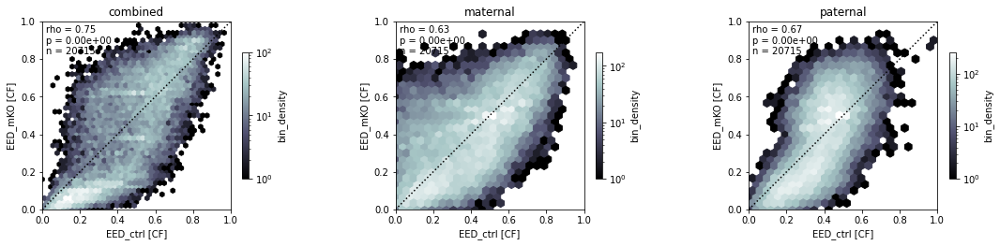

In [231]:
comparison = 'EED_mKO_vs_ctrl'
project_data = 'bin_density'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='bone', clrrange=[])
# outfn = FIGOUTDIR + 'CF_comparison.hexbin.comparison_of_%s.colored_by_%s.pdf' % (comparison, project_data)
# plt.savefig(outfn, bbox_inches='tight')

## 8.3 Effect of strain - colored by bin density

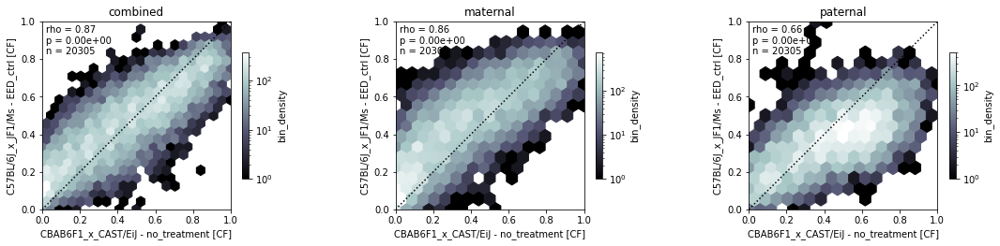

In [232]:
comparison = 'Peters_vs_Kind'
project_data = 'bin_density'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='bone')
# outfn = FIGOUTDIR + 'CF_comparison.hexbin.comparison_of_%s.colored_by_%s.pdf' % (comparison, project_data)
# plt.savefig(outfn, bbox_inches='tight')

## 8.4 Comparison of stages - colored by bin density - homozygous 2-cell sample

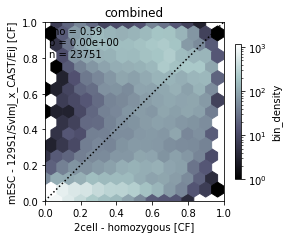

In [233]:
comparison = 'mESC_vs_2cell_homozygous'
project_data = 'bin_density'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='bone')

## 8.5 Comparison of stages - colored by bin density - heterozygous 2-cell sample

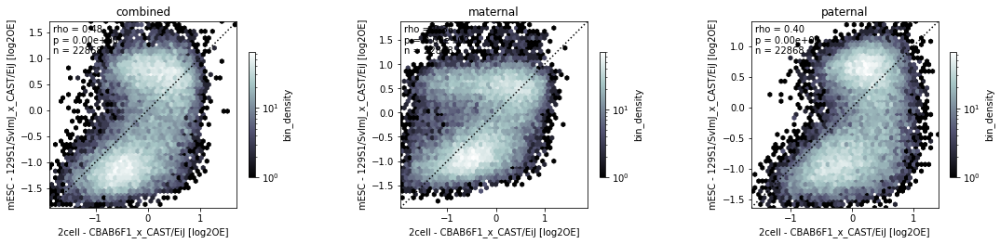

In [234]:
comparison = 'mESC_vs_2cell_hybrid'
project_data = 'bin_density'
metric = 'log2OE'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='bone')

## 8.6 Effect of EED mKO vs WT - colored by 2-cell H3K27me3

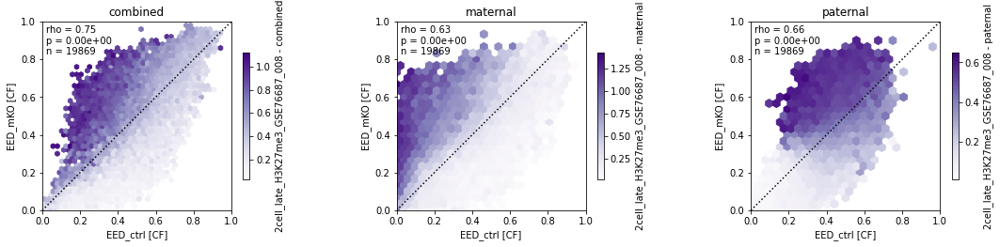

In [235]:
comparison = 'EED_mKO_vs_ctrl'
project_data = '2cell_late_H3K27me3_GSE76687_008'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='Purples')

## 8.7 Effect of EED mKO vs WT -  colored by allelic 2-cell H3K9me3 ChIP-seq data

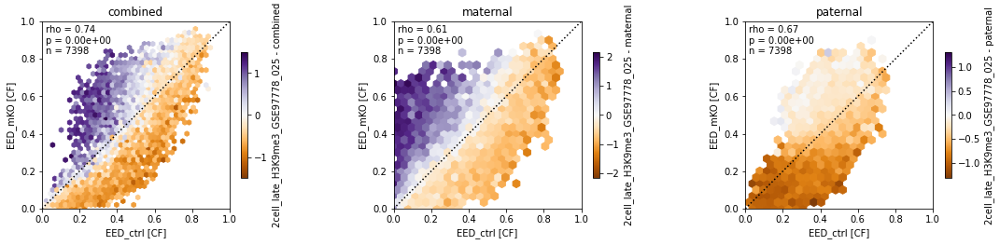

In [236]:
comparison = 'EED_mKO_vs_ctrl'
project_data = '2cell_late_H3K9me3_GSE97778_025'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='PuOr')

## 8.8 Effect of EED mKO vs WT - colored by allelic 2-cell H2AK119ub1 ChIP-seq data

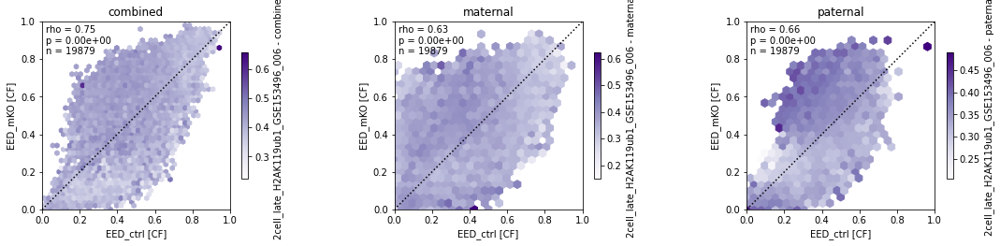

In [237]:
comparison = 'EED_mKO_vs_ctrl'
project_data = '2cell_late_H2AK119ub1_GSE153496_006'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='Purples')

## 8.9 Effect of EED mKO vs WT -  colored by allelic 2-cell H3K4me3 ChIP-seq data

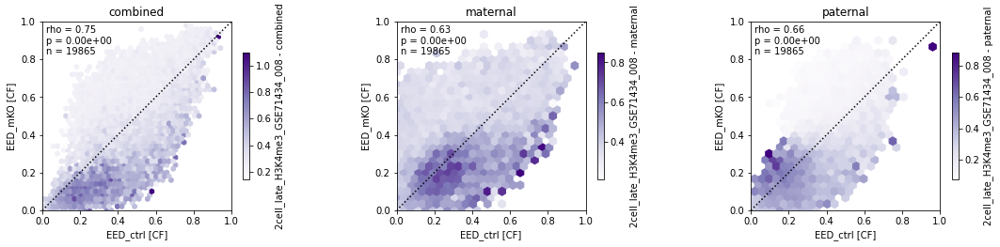

In [238]:
comparison = 'EED_mKO_vs_ctrl'
project_data = '2cell_late_H3K4me3_GSE71434_008'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, cmap='Purples')

## 8.10 Effect of EED mKO vs WT - colored by of mESC CF

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/495276598.py:12: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ('filt' in color_val_dict[project_data]) and plot_allelic:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if parent in colorvals:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:46: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif 'combined' in colorvals:


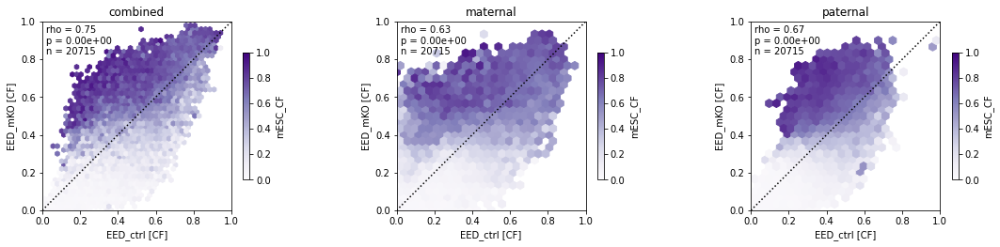

In [239]:
comparison = 'EED_mKO_vs_ctrl'
project_data = 'mESC_CF'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, clrrange=[0,1], cmap='Purples')

## 8.11 Effect of EED mKO vs WT - colored by PAD density

/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/495276598.py:12: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ('filt' in color_val_dict[project_data]) and plot_allelic:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if parent in colorvals:
/var/folders/f6/njqy731d5qzd2j0713w49f2jrtp6zr/T/ipykernel_17135/3677812072.py:46: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif 'combined' in colorvals:


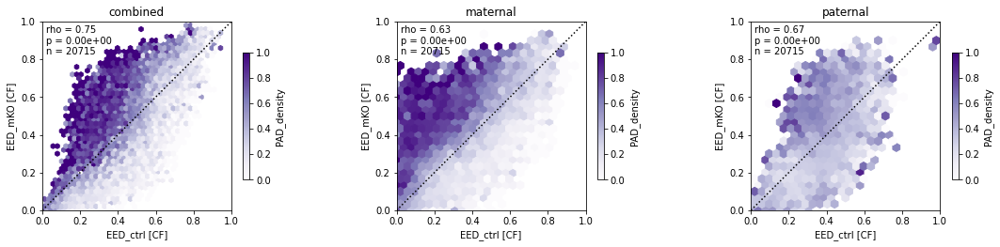

In [240]:
comparison = 'EED_mKO_vs_ctrl'
project_data = 'PAD_density'
metric = 'CF'

condition1, condition2 = condition_comparisons[comparison]
colorvals = color_val_dict[project_data]
filt = determine_filt_for_hexbin(comparison, project_data)

hexbin_comparison_with_projection(condition1, condition2, metric, colorvals, project_data, filt, clrrange=[0,1], cmap='Purples')

## 8.12 Correlate differential EED mKO vs WT CF with H3K27me3

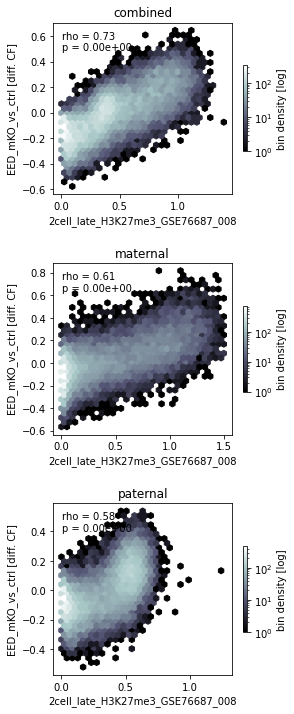

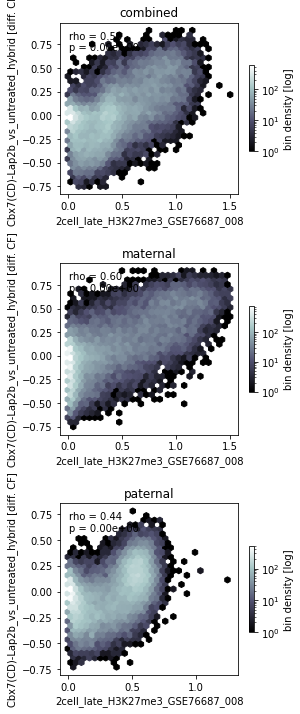

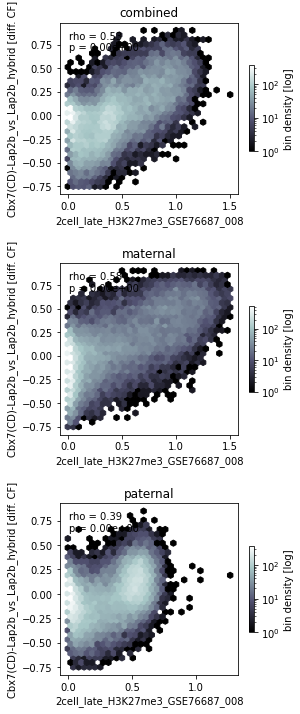

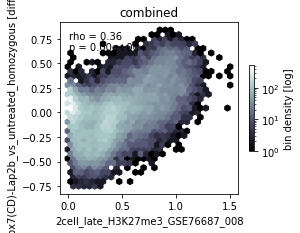

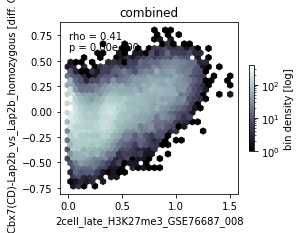

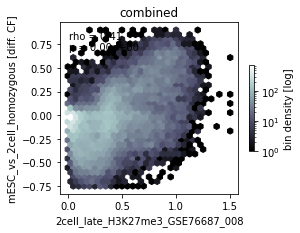

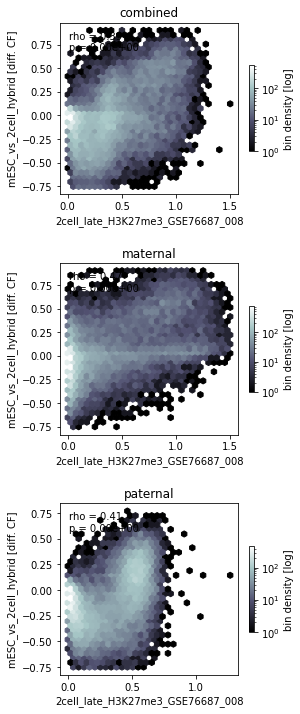

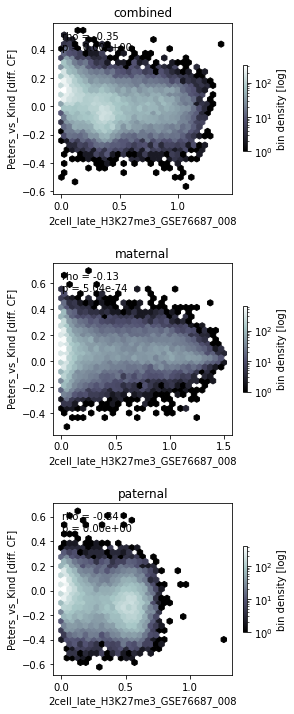

In [241]:
comparison_ls = [
    'EED_mKO_vs_ctrl', 
    'Cbx7(CD)-Lap2b_vs_untreated_hybrid', 'Cbx7(CD)-Lap2b_vs_Lap2b_hybrid', 
    'Cbx7(CD)-Lap2b_vs_untreated_homozygous', 'Cbx7(CD)-Lap2b_vs_Lap2b_homozygous',
    'mESC_vs_2cell_homozygous', 'mESC_vs_2cell_hybrid', 'Peters_vs_Kind'
]

for comparison in comparison_ls:

    fig, axes = plt.subplots(3,1,figsize=(4,12))
    plt.subplots_adjust(hspace=.4)

    project_data = '2cell_late_H3K27me3_GSE76687_008'
    metric = 'CF'

    condition1, condition2 = condition_comparisons[comparison]
    colorvals = color_val_dict[project_data]
    filt = determine_filt_for_hexbin(comparison, project_data)

    for icol, parent in enumerate(['combined', 'maternal', 'paternal']):
        
        if (condition1 not in contact_freq[parent]) or (condition2 not in contact_freq[parent]):
            axes[icol].remove()
            continue
        X = np.concatenate([contact_freq[parent][condition1][c] for c in chrom_order[:-2]])
        Y = np.concatenate([contact_freq[parent][condition2][c] for c in chrom_order[:-2]])

        if parent in color_val_dict[project_data]:
            C = color_val_dict[project_data][parent]
        elif 'combined' in color_val_dict[project_data]:
            C = color_val_dict[project_data]['combined']
        else:
            C = color_val_dict[project_data]

        X = X[filt]
        Y = Y[filt]
        C = C[filt]
        diff_CF = (Y-X).clip(-.75,.9)

        ax = axes[icol]
        p = ax.hexbin(
            C.clip(0,1.5), diff_CF, 
            bins='log', gridsize=30, cmap='bone', mincnt=1
        )

        ax.set_title(parent)
        ax.set_ylabel('%s [diff. CF]' % comparison)
        ax.set_xlabel(project_data)

        cbar = plt.colorbar(p, ax=ax, shrink=0.5)
        cbar.ax.set_ylabel('bin density [log]')

        r, p = stats.spearmanr(diff_CF, C)
        ax.text(0.05, 0.95, 'rho = %.2f\np = %.2e' % (r, p), va='top', ha='left', transform=ax.transAxes)

    outfn = FIGOUTDIR + 'hexbin.differential_of_%s_versus_%s.DamID_%s_values.pdf' % (comparison, project_data, metric)
    plt.savefig(outfn, bbox_inches='tight')
    plt.show()
    plt.close()

# 9. Comparison of alleles

## 9.2 Maternal versus paternal CF in 2-cell embryo - colored by allelic H3K27me3

In [31]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

In [32]:
top = mpl.colormaps['Blues_r'].resampled(128)
bottom = mpl.colormaps['Reds'].resampled(128)

newcolors = np.vstack((top(np.linspace(0, 1, 128)),
                       bottom(np.linspace(0, 1, 128))))
RedsBlues = ListedColormap(newcolors, name='RedsBlues')


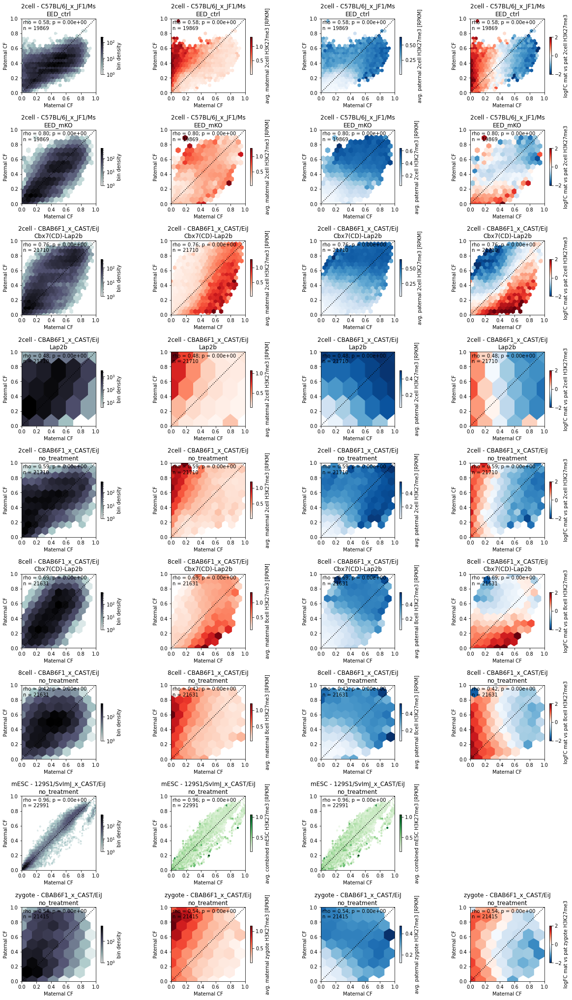

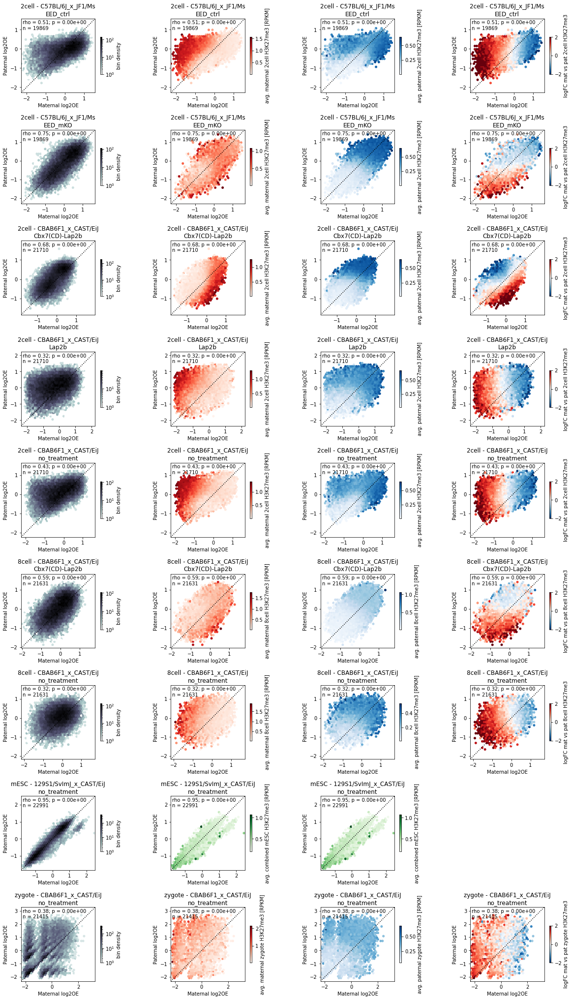

In [39]:
## determine allele visibility for external sample
vis_dict = dict()
vis_filt_dict = dict()
ext_samples = {
    'zygote': 'GSE76687_006',
    '2cell': 'GSE76687_008',
    '8cell': 'GSE76687_009',
    'mESC': 'GSE76687_018'
}
for stage in ['zygote', '2cell', '8cell', 'mESC']:
    ext_sample = ext_samples[stage]
    
    if ext_sample in ext_data['allele_vis']:
        vis = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
        ind = (vis == 0) | np.isnan(v) | np.isinf(v)
        v_filt = np.copy(vis) > 0.2
        v_filt[ind] = False
        vis[ind] = 1
    else:
        n = sum([len(mapab[c]) for c in chrom_order[:-2]])
        v_filt = np.ones(n).astype(bool)
        vis = np.ones(n)
        
    vis_dict[stage] = vis
    vis_filt_dict[stage] = v_filt
    
# determining bin filtering
g_anno = anno[anno.is_heterozygous & anno.DamID_PASS_allelic].groupby(['stage', 'genotype', 'treatment'])


for metric in ['CF', 'log2OE']:
    
    nrow = len(list(g_anno))
    ncol = 4
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow))
    plt.subplots_adjust(hspace=.5, wspace=.5)
    counter = 0

    for sample, df in g_anno:
        title = '%s - %s\n%s' % sample

        # select external sample for projection
        ext_sample = ext_samples[sample[0]]

        # select chromosomes
        selected_chroms = chrom_order[:-2]

        # determine bin filtering
        mapab_filt = np.concatenate([mapab[c] for c in selected_chroms]) > MINMAP
        al_filt = np.concatenate([allele_filt_gt[sample[1]][c] for c in selected_chroms])
        filt_ind = mapab_filt & al_filt & vis_filt_dict[sample[0]]

        # select allelic CF data
        if metric == 'CF':
            X = np.concatenate([contact_freq['maternal'][sample][c] for c in selected_chroms])[filt_ind]
            Y = np.concatenate([contact_freq['paternal'][sample][c] for c in selected_chroms])[filt_ind]
            extent = [0,1,0,1]
            lim = [0,1]
            gs = min(int((len(df)+1)/2), 50)

        else:
            X = np.concatenate([damid_insilico_logoe['maternal'][sample][c] for c in selected_chroms])[filt_ind]
            Y = np.concatenate([damid_insilico_logoe['paternal'][sample][c] for c in selected_chroms])[filt_ind]
            mn = min(X.min(),Y.min())
            mx = max(X.max(),Y.max())
            extent = [mn, mx, mn, mx]
            lim = [mn, mx]
            gs = 40
            gs_bins = np.linspace(mn,mx,n+1)
            
        # select ChIP-seq data
        ext_sample_vals = dict()
        for parent in ['maternal', 'paternal']:
            
            # if allele-specific data is available
            if ext_sample in ext_data[parent]:
                C = np.concatenate([ext_data[parent + '_corrected'][ext_sample][c] for c in selected_chroms])[filt_ind]
            # otherwise use combined data
            else:
                C = np.concatenate([ext_data['combined'][ext_sample][c] for c in selected_chroms])[filt_ind]
                parent = 'combined'
            ext_sample_vals[parent] = C

        # color bins by maternal and paternal H3K27me3
        for icol, parent in enumerate(['bin_density', 'maternal', 'paternal', 'logFC_mat_vs_pat']):

            ax = axes[counter, icol]
            ax.set_title(title)


            # select data
            if parent == 'bin_density':
                # plot 
                p = ax.hexbin(X, Y, bins='log', extent=extent, gridsize=gs, mincnt=1, cmap='bone_r')
                cbar = plt.colorbar(p, ax=ax, shrink=.5)
                cbar.ax.set_ylabel('bin density')
            
            elif parent == 'logFC_mat_vs_pat':
                if 'maternal' not in ext_sample_vals:
                    ax.remove()
                    continue
                    
                M = ext_sample_vals['maternal']
                P = ext_sample_vals['paternal']
                C = np.log2( (M + .1) / (P + .1) )
                
                p = ax.hexbin(X, Y, C, extent=extent, gridsize=gs, mincnt=1, cmap=RedsBlues, vmin=-2, vmax=2)
                cbar = plt.colorbar(p, ax=ax, shrink=.5)
                cbar.ax.set_ylabel('logFC mat vs pat %s H3K27me3' % sample[0])
                
            else:

                if parent in ext_sample_vals:
                    C = ext_sample_vals[parent]
                else:
                    C = ext_sample_vals['combined']
                    parent = 'combined'

                # plot 
                cmap = {'maternal': 'Reds', 'paternal': 'Blues', 'combined': 'Greens'}[parent]
                p = ax.hexbin(X, Y, C, extent=extent, gridsize=gs, mincnt=1, cmap=cmap)
                cbar = plt.colorbar(p, ax=ax, shrink=.5)
                cbar.ax.set_ylabel('avg. %s %s H3K27me3 [RPKM]' % (parent, sample[0]))



            ax.set_xlim(lim)
            ax.set_ylim(lim)
            ax.set_aspect('equal')
            ax.set_xlabel('Maternal %s' % metric)
            ax.set_ylabel('Paternal %s' % metric)
            ax.plot(lim, lim, c='k', ls=':')

            r, p = stats.spearmanr(X, Y)
            t = 'rho = %.2f; p = %.02e\nn = %d' % (r,p,len(X))
            ax.text(0.02, 0.98, t, va='top', transform=ax.transAxes)

        counter += 1

    outfn = FIGOUTDIR + 'allelic_bias.maternal_vs_paternal_%s.hexbin.colored_by_allelic_H3K27me3.pdf' % metric
    plt.savefig(outfn, bbox_inches='tight')
    plt.show()
    plt.close()

## 9.3 Maternal versus paternal CF in 2-cell embryo - split by presence of H3K27me3

In [40]:
THRESH = 0.2

In [43]:
selected_chroms = chrom_order[:-2]

zygote 0.6574051507027379
2cell 0.6574051507027379
8cell 0.6751563896336015
mESC 0.8593305711268178


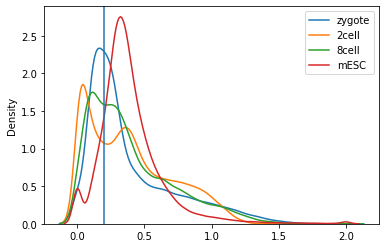

In [44]:
ext_samples = {
    'zygote': 'GSE76687_006',
    '2cell': 'GSE76687_008',
    '8cell': 'GSE76687_009',
    'mESC': 'GSE76687_018'
}

fig, ax = plt.subplots()

for stage, ext_sample in ext_samples.items():
    C = np.concatenate([ext_data['combined'][ext_sample][c] for c in selected_chroms])
    sns.kdeplot(C.clip(0,2), label=stage)
    
    print(stage, (C>THRESH).mean())
    
ax.legend()
ax.axvline(THRESH)

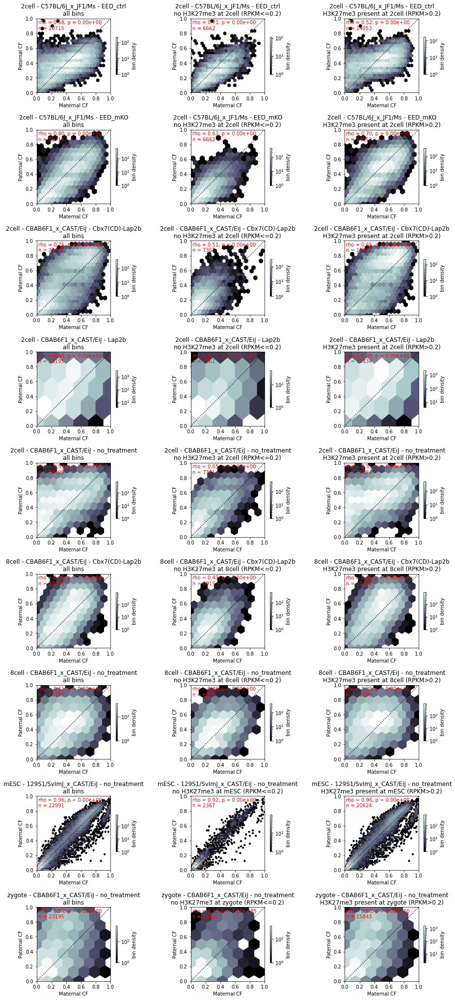

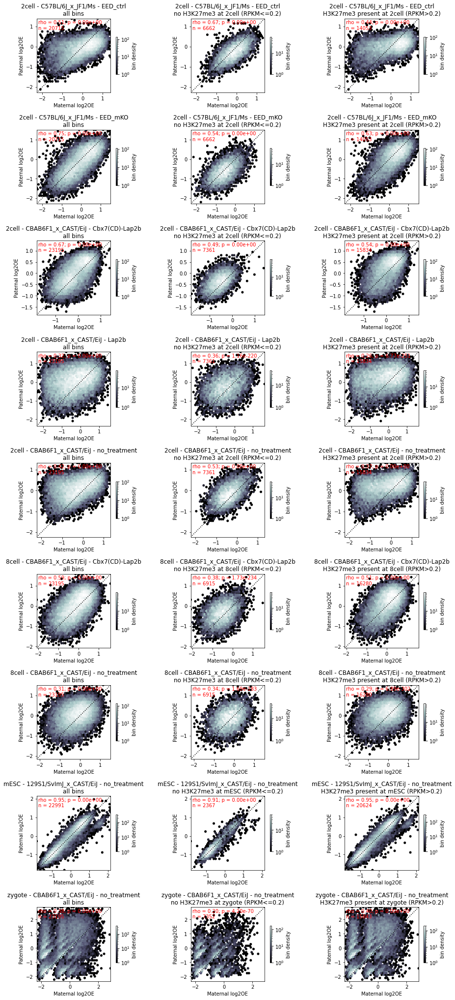

In [46]:
ext_samples = {
    'zygote': 'GSE76687_006',
    '2cell': 'GSE76687_008',
    '8cell': 'GSE76687_009',
    'mESC': 'GSE76687_018'
}

g_anno = anno[anno.is_heterozygous & anno.DamID_PASS_allelic].groupby(['stage', 'genotype', 'treatment'])

for metric in ['CF', 'log2OE']:
    
    nrow = len(list(g_anno))
    ncol = 3
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow))
    plt.subplots_adjust(hspace=.5, wspace=.5)
    counter = 0

    for sample, df in g_anno:
        title = '%s - %s - %s' % sample

        # select external sample for projection
        ext_sample = ext_samples[sample[0]]

        # select chromosomes
        selected_chroms = chrom_order[:-2]

        # determine bin filtering
        mapab_filt = np.concatenate([mapab[c] for c in selected_chroms]) > MINMAP
        al_filt = np.concatenate([allele_filt_gt[sample[1]][c] for c in selected_chroms])
        filt_ind = mapab_filt & al_filt

        # select allelic CF data
        if metric == 'CF':
            X = np.concatenate([contact_freq['maternal'][sample][c] for c in selected_chroms])[filt_ind]
            Y = np.concatenate([contact_freq['paternal'][sample][c] for c in selected_chroms])[filt_ind]
            extent = [0,1,0,1]
            lim = [0,1]
            mn, mx = (0,1)
            gs = min(int((len(df)+1)/2), 50)
        else:
            X = np.concatenate([damid_insilico_logoe['maternal'][sample][c] for c in selected_chroms])[filt_ind]
            Y = np.concatenate([damid_insilico_logoe['paternal'][sample][c] for c in selected_chroms])[filt_ind]
            mn = min(X.min(),Y.min())
            mx = max(np.percentile(X,99.98), np.percentile(Y, 99.98))
            extent = [mn, mx, mn, mx]
            lim = [mn, mx]
            gs = 40
            
        # get H3K27me3 values
        ext_sample = ext_samples[sample[0]]
        k27_vals = np.concatenate([ext_data['combined'][ext_sample][c] for c in chrom_order[:-2]])[filt_ind]
        inddict = {
            'all bins': np.ones_like(k27_vals).astype(bool),
            'no H3K27me3 at %s (RPKM<=%.1f)' % (sample[0], THRESH): (k27_vals <= THRESH), 
            'H3K27me3 present at %s (RPKM>%.1f)' % (sample[0], THRESH): (k27_vals > THRESH)
        }
        

        # plot maternal vs paternal - divided by presence of H3K27me3
        for icol, k27presence in enumerate(inddict.keys()):

            ax = axes[counter, icol]
            ax.set_title(title + '\n' + k27presence)


            # plot data
            select_bins = inddict[k27presence]
            p = ax.hexbin(
                X[select_bins].clip(mn,mx), Y[select_bins].clip(mn,mx), 
                bins='log', extent=extent, gridsize=gs, mincnt=1, cmap='bone'
            )
            cbar = plt.colorbar(p, ax=ax, shrink=.5)
            cbar.ax.set_ylabel('bin density')

            ax.set_xlim(lim)
            ax.set_ylim(lim)
            ax.set_aspect('equal')
            ax.set_xlabel('Maternal %s' % metric)
            ax.set_ylabel('Paternal %s' % metric)
            ax.plot(lim, lim, c='k', ls=':')

            r, p = stats.spearmanr(X[select_bins], Y[select_bins])
            t = 'rho = %.2f; p = %.02e\nn = %d' % (r,p,len(X[select_bins]))
            ax.text(0.02, 0.98, t, va='top', transform=ax.transAxes, color='r')

        counter += 1

    outfn = FIGOUTDIR + 'allelic_bias.maternal_vs_paternal_%s.hexbin.split_on_presence_of_H3K27me3.pdf' % metric
    plt.savefig(outfn, bbox_inches='tight')
    plt.show()
    plt.close()

## 9.4 Relationship between allelic difference in CF and H3K27me3

0.807092371435535
0.807092371435535
0.881875050775855
0.881875050775855
0.881875050775855


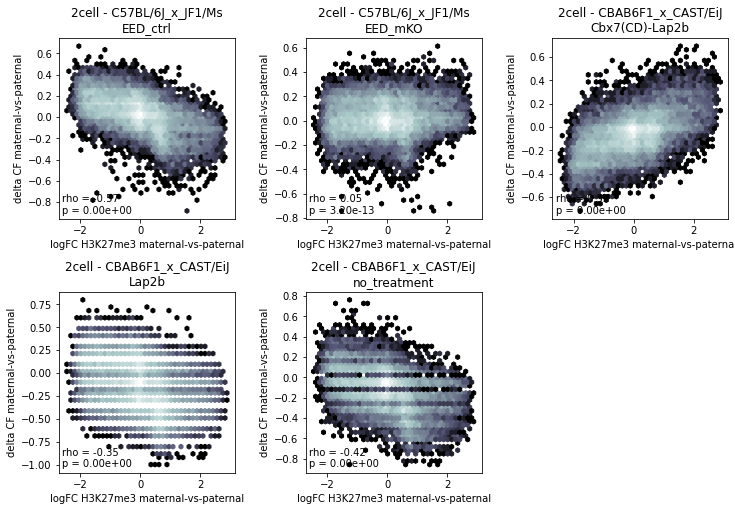

0.807092371435535
0.807092371435535
0.881875050775855
0.881875050775855
0.881875050775855


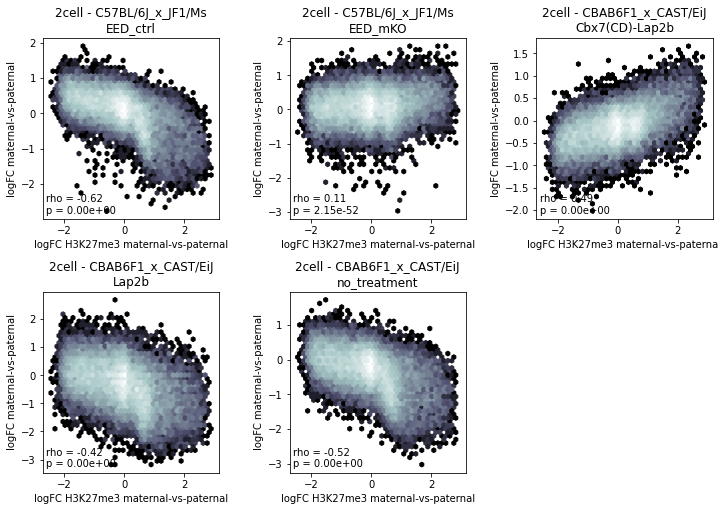

In [137]:
annotmp = anno_comb[(anno_comb.stage=='2cell') & anno_comb.is_heterozygous].copy()
ext_sample = 'GSE76687_008'

# determining bin filtering
mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP

if ext_sample in ext_data['allele_vis']:
    v = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
    v[np.isnan(v)] = 0
    v_filt = v > 0.2
else:
    v_filt = np.ones(len(mapab_filt)).astype(bool)

A = np.concatenate([ext_data['maternal'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
B = np.concatenate([ext_data['paternal'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
FC = np.log2( (A + .1) / (B + .1) )

for metric in ['CF', 'log2OE']:
    nplot = len(annotmp)
    ncol = 3
    nrow = int(np.ceil(nplot/ncol))
    fig, axes = plt.subplots(nrow,ncol,figsize=(ncol*4, nrow*4))
    plt.subplots_adjust(wspace=.4, hspace=.4)
    counter = 0
    
    ax_summary = axes[-1,-1]

    for _, row in annotmp.iterrows():
        sample = (row['stage'], row['genotype'], row['treatment'])
        ax = axes.flatten()[counter]
        counter += 1

        al_filt = np.concatenate([allele_filt_gt[row['genotype']][c] for c in chrom_order[:-2]])
        filt_ind = mapab_filt & al_filt & v_filt
        print(filt_ind.mean())

        if metric == 'CF':
            A = np.concatenate([contact_freq['maternal'][sample][c] for c in chrom_order[:-2]])
            B = np.concatenate([contact_freq['paternal'][sample][c] for c in chrom_order[:-2]])
            ylab = 'delta CF'
        else:
            A = np.concatenate([damid_insilico_logoe['maternal'][sample][c] for c in chrom_order[:-2]])
            B = np.concatenate([damid_insilico_logoe['paternal'][sample][c] for c in chrom_order[:-2]])
            ylab = 'logFC'
        D = A - B

        # plot hexbin
        ax.hexbin(FC[filt_ind], D[filt_ind], bins='log', gridsize=40, mincnt=1, cmap='bone')
        ax.set_title('%s - %s\n%s' % sample)
        ax.set_ylabel('%s maternal-vs-paternal' % ylab)
        ax.set_xlabel('logFC H3K27me3 maternal-vs-paternal')
        
        # compute correlation
        corr = stats.spearmanr(D[filt_ind], FC[filt_ind])
        t = 'rho = %.2f\np = %.02e' % corr
        ax.text(0.02, 0.02, t, va='bottom', transform=ax.transAxes)

    while counter < (nrow*ncol):
        axes.flatten()[counter].remove()
        counter += 1

    outfn = FIGOUTDIR + 'allelic_bias.differential_allelic_%s_vs_differential_allelic_H3K27me3.hexbin.colored_by_bin_density.pdf' % metric
    plt.savefig(outfn, bbox_inches='tight')
    plt.show()
    plt.close()

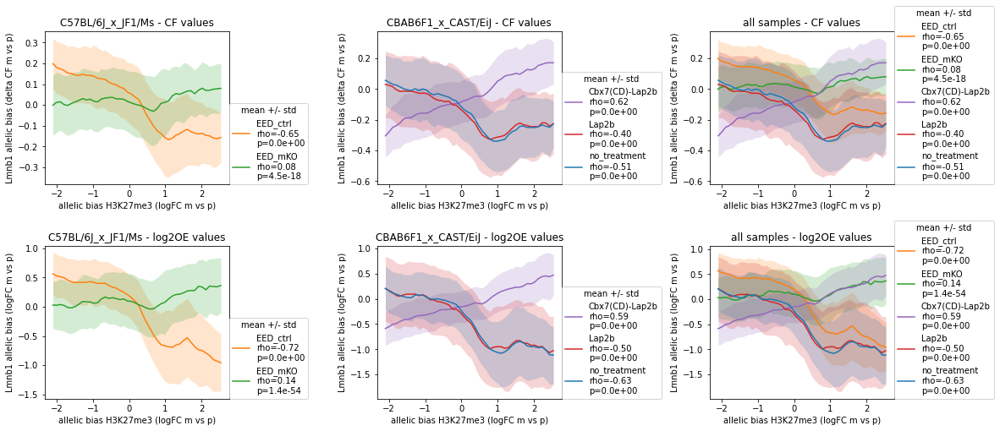

In [160]:
annotmp = anno_comb[(anno_comb.stage=='2cell') & anno_comb.is_heterozygous].copy()
ext_sample = 'GSE76687_008'

# determining bin filtering
mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP

if ext_sample in ext_data['allele_vis']:
    v = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
    v[np.isnan(v)] = 0
    v_filt = v > 0.2
else:
    v_filt = np.ones(len(mapab_filt)).astype(bool)

A = np.concatenate([ext_data['maternal'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
B = np.concatenate([ext_data['paternal'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
FC = np.log2( (A + .1) / (B + .1) )

k27_filt = (A > 0.2) | (B > 0.2)

g_anno = annotmp.groupby('genotype')
nrow = 2
ncol = len(list(g_anno)) + 1
fig, axes = plt.subplots(nrow,ncol,figsize=(ncol*6, nrow*4))
plt.subplots_adjust(wspace=.8, hspace=.4)
counter = 0
    
clrdict = {t: sns.color_palette('tab10',n_colors=10)[i] for i, t in enumerate(treatment_order)}
    
for irow, metric in enumerate(['CF', 'log2OE']):
    
    icol = -1
    ax_all = axes[irow,-1]
    
    for gt, df_gt in g_anno:
        icol += 1
        
        ax = axes[irow,icol]
        ax.set_title('%s - %s values' % (gt, metric))

        for _, row in df_gt.iterrows():
            sample = (row['stage'], row['genotype'], row['treatment'])

            al_filt = np.concatenate([allele_filt_gt[row['genotype']][c] for c in chrom_order[:-2]])
            filt_ind = mapab_filt & al_filt & v_filt & k27_filt
            
            if metric == 'CF':
                A = np.concatenate([contact_freq['maternal'][sample][c] for c in chrom_order[:-2]])
                B = np.concatenate([contact_freq['paternal'][sample][c] for c in chrom_order[:-2]])
                ylab = 'delta CF'
            else:
                A = np.concatenate([damid_insilico_logoe['maternal'][sample][c] for c in chrom_order[:-2]])
                B = np.concatenate([damid_insilico_logoe['paternal'][sample][c] for c in chrom_order[:-2]])
                ylab = 'logFC'
            D = A - B

            # plot trend
            x = FC[filt_ind]
            y = D[filt_ind]
            mn, mx = np.percentile(x,[1,99])
            n = int((mx-mn)/0.1)
            fc_steps = np.linspace(mn, mx, n)
            m_ls = list()
            s_ls = list()
            sem_ls = list()
            for f in fc_steps:
                ind = (x > (f-0.1)) & (x < (f+0.1))
                m_ls.append(np.mean(y[ind]))
                s_ls.append(np.std(y[ind]))
                sem_ls.append(stats.sem(y[ind]))
            m_ls = np.array(m_ls)
            s_ls = np.array(s_ls)
            sem_ls = np.array(sem_ls)
            
            # compute correlation
            corr, pval = stats.spearmanr(D[filt_ind], FC[filt_ind])
            lab = '%s\nrho=%.2f\np=%.01e' % (sample[2],corr,pval)

            ax.plot(fc_steps, m_ls, label=lab, c=clrdict[sample[2]])
            ax.fill_between(fc_steps, m_ls-s_ls, m_ls+s_ls, alpha=0.2, lw=0, color=clrdict[sample[2]])
            ax_all.plot(fc_steps, m_ls, label=lab, c=clrdict[sample[2]])
            ax_all.fill_between(fc_steps, m_ls-s_ls, m_ls+s_ls, alpha=0.2, lw=0, color=clrdict[sample[2]])

    for ax in axes[irow,:]:
        ylab = 'delta CF' if metric == 'CF' else 'logFC'
        ax.set_ylabel('Lmnb1 allelic bias (%s m vs p)' % ylab)
        ax.set_xlabel('allelic bias H3K27me3 (logFC m vs p)')
        ax.legend(loc=(1,0), title='mean +/- std')
    ax_all.set_title('all samples - %s values' % metric)
        
outfn = FIGOUTDIR + 'allelic_bias.differential_allelic_Lmnb1_vs_differential_allelic_H3K27me3.trendlines.pdf'
plt.savefig(outfn, bbox_inches='tight')
plt.show()
plt.close()

## 9.5 Relationship between allelic CF and H3K27me3

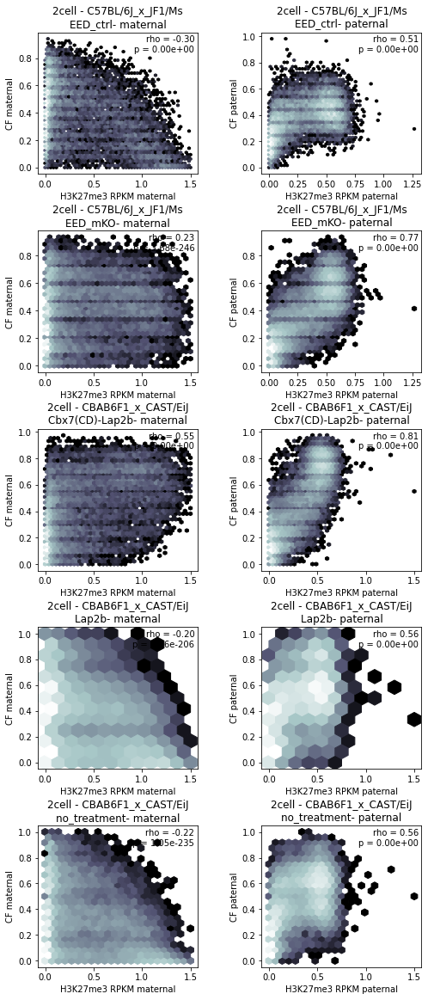

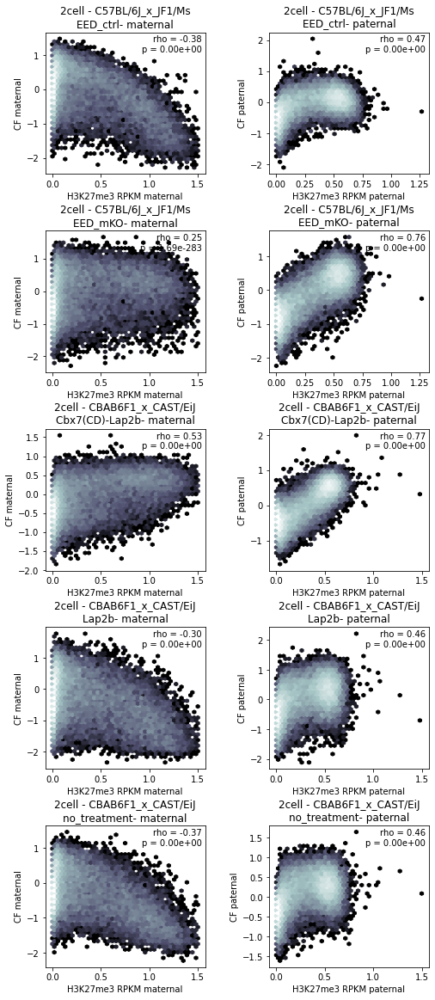

In [249]:
ind = (anno.stage=='2cell') & anno.is_heterozygous & anno.DamID_PASS_allelic
g_anno = anno[ind].groupby(['stage','genotype','treatment'])
ext_sample = 'GSE76687_008'

# determining bin filtering
mapab_filt = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP

if ext_sample in ext_data['allele_vis']:
    v = np.concatenate([ext_data['allele_vis'][ext_sample][c][:len(mapab[c])] for c in chrom_order[:-2]])
    v[np.isnan(v)] = 0
    v_filt = v > 0.1
else:
    v_filt = np.ones(len(mapab_filt)).astype(bool)

A = np.concatenate([ext_data['maternal_corrected'][ext_sample][c] for c in chrom_order[:-2]])
B = np.concatenate([ext_data['paternal_corrected'][ext_sample][c] for c in chrom_order[:-2]])

for metric in ['CF', 'log2OE']:
    nrow = len(list(g_anno))
    fig, axes = plt.subplots(nrow,2,figsize=(8,4*nrow))
    plt.subplots_adjust(wspace=.4, hspace=.4)
    r_counter = 0

    for sample, annodf in g_anno:

        al_filt = np.concatenate([allele_filt_gt[sample[1]][c] for c in chrom_order[:-2]])
        filt_ind = mapab_filt & al_filt & v_filt

        for icol, parent in enumerate(['maternal', 'paternal']):
            ax = axes[r_counter, icol]

            X = A if parent == 'maternal' else B
            if metric == 'CF':
                Y = np.concatenate([contact_freq[parent][sample][c] for c in chrom_order[:-2]])
            else:
                Y = np.concatenate([damid_insilico_logoe[parent][sample][c] for c in chrom_order[:-2]])

            gs = len(annodf)+1 if metric == 'CF' else 40
            ax.hexbin(X[filt_ind].clip(0,1.5), Y[filt_ind], bins='log', gridsize=gs, mincnt=1, cmap='bone')
            ax.set_title(('%s - %s\n%s' % sample) + '- ' + parent)
            ax.set_ylabel('CF %s' % parent)
            ax.set_xlabel('H3K27me3 RPKM %s' % parent)


            corr = stats.spearmanr(X[filt_ind], Y[filt_ind])
            t = 'rho = %.2f\np = %.02e' % corr
            ax.text(0.98, 0.98, t, va='top', ha='right', transform=ax.transAxes)

        r_counter += 1

    outfn = FIGOUTDIR + 'correlation_between_allelic_%s_and_H3K27me3.hexbin.colored_by_bin_density.pdf' % metric
    plt.savefig(outfn, bbox_inches='tight')

## 9.6 Plotting allelic signal on top of each other for comparison

In [250]:
ext_anno[ext_anno.target=='H3K27me3']

,sample_id,technique,stage,target,treatment,is_heterozygous,genotype,genotype_maternal,genotype_paternal,dataset_id,control_id,replicate,library_layout,read_length_bp
53,GSE73952_002,ChIP-seq,morula,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_015,rep12,PAIRED,250
56,GSE73952_005,ChIP-seq,MII_oocyte,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_003,rep123,PAIRED,250
59,GSE73952_008,ChIP-seq,2cell,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_006,rep123,PAIRED,250
62,GSE73952_011,ChIP-seq,4cell,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_009,rep123,PAIRED,250
65,GSE73952_014,ChIP-seq,8cell,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_012,rep123,PAIRED,250;300
69,GSE73952_018,ChIP-seq,ICM,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_016,rep12,PAIRED,250
75,GSE73952_024,ChIP-seq,mESC,H3K27me3,no,False,B6D2F1,NaN,NaN,GSE73952,GSE73952_022,rep1234,SINGLE,71
81,GSE76687_001,ChIP-seq,sperm,H3K27me3,no,False,PWK,NaN,NaN,GSE76687,none,rep1,SINGLE,51;252;202
84,GSE76687_004,ChIP-seq,GV_oocyte,H3K27me3,no,False,C57BL/6N,NaN,NaN,GSE76687,none,rep1,PAIRED,202;252
85,GSE76687_005,ChIP-seq,MII_oocyte,H3K27me3,no,False,C57BL/6N,NaN,NaN,GSE76687,none,rep12,PAIRED,202;252


In [251]:
def plot_overlaid_allelic_profiles(annotmp, chrom, interval=[]):
    nrow = len(annotmp) + 1
    if len(interval) == 0:
        figw = 12 * len(mapab[chrom]) / len(mapab['1'])
    else:
        figw = (interval[1]-interval[0])/4e6
    fig, axes = plt.subplots(nrow, 1, figsize=(figw, 2*nrow))
    plt.subplots_adjust(hspace=1)
    counter = 0

    mapab_filt = mapab[chrom] > MINMAP
    
    if len(interval) == 2:
        select_ind = np.arange(int(interval[0]//BINSIZE), int(np.ceil(interval[1]/BINSIZE)))


    # plot ChIPseq 2cell H3K27me3
    ext_sample = 'GSE76687_008'
    ax = axes[counter]
    counter += 1
    
    smooth_std = 150000
    W = gaussian(np.ceil(smooth_std / BINSIZE * 6 / 2) * 2 + 1, smooth_std / BINSIZE)
    W /= W.sum()
    
    for allele in ['maternal', 'paternal']:
        Y = ext_data['%s_corrected' % allele][ext_sample][chrom]
        X = (np.arange(0, len(Y)*BINSIZE, BINSIZE) + BINSIZE/2) / 1e6
        if len(interval) == 0:
            Y = fftconvolve(Y, W, mode='same')
        else:
            Y = Y[select_ind]
            X = X[select_ind]
        ax.fill_between(X, 0, Y, color=color_dict['allele'][allele], alpha=.5, label='maternal', lw=0)
    ax.set_ylabel('RPKM')
    ax.set_xlim(X[0], X[-1])
    ax.set_title('2cell H3K27me3 (%s)' % ext_sample)
    ax.legend(loc=(1,0))
    
    # plot allele visibility
    ylim = ax.get_ylim()
    A = (ext_data['allele_vis'][ext_sample][chrom] > 0.1).astype(int)
    if len(interval) == 2:
        A = A[select_ind]
    A = np.atleast_2d(A)
    ax.imshow(A, extent=[X[0], X[-1], -.1, 0], aspect='auto', cmap='binary_r', vmin=0, vmax=1)
    ax.set_ylim(-.1,ylim[1])
    
        
    # plot DamID samples
    for _, row in annotmp.iterrows():
        ax = axes[counter]
        counter += 1

        sample = (row['stage'], row['genotype'], row['treatment'])
        title = '%s - %s - %s' % sample
        ax.set_title(title)

        al_filt = allele_filt_gt[row['genotype']][chrom]

        Ym = np.copy(contact_freq['maternal'][sample][chrom])
        Yp = np.copy(contact_freq['paternal'][sample][chrom])
        X = (np.arange(0, len(Ym)*BINSIZE, BINSIZE) + BINSIZE/2) / 1e6
        
        if len(interval) == 2:
            Ym = Ym[select_ind]
            Yp = Yp[select_ind]
            X = X[select_ind]

        ax.fill_between(X, 0, Ym, color=color_dict['allele']['maternal'], alpha=.5, label='maternal', lw=0)
        ax.fill_between(X, 0, Yp, color=color_dict['allele']['paternal'], alpha=.5, label='paternal', lw=0)

        ax.set_xlim(X[0], X[-1])

        # plot allele visibility
        A = al_filt
        A[~mapab_filt] = 0
        A = np.atleast_2d(A)
        ax.imshow(A, extent=[0, X[-1], -.1, 0], aspect='auto', cmap='binary_r', vmin=0, vmax=1)
        ax.set_ylim(-.1,1)
        ax.set_ylabel('CF')
        ax.legend(loc=(1,0))

    ax.set_xlabel('chromosome %s [Mb]' % chrom)

__Chromosome 12__

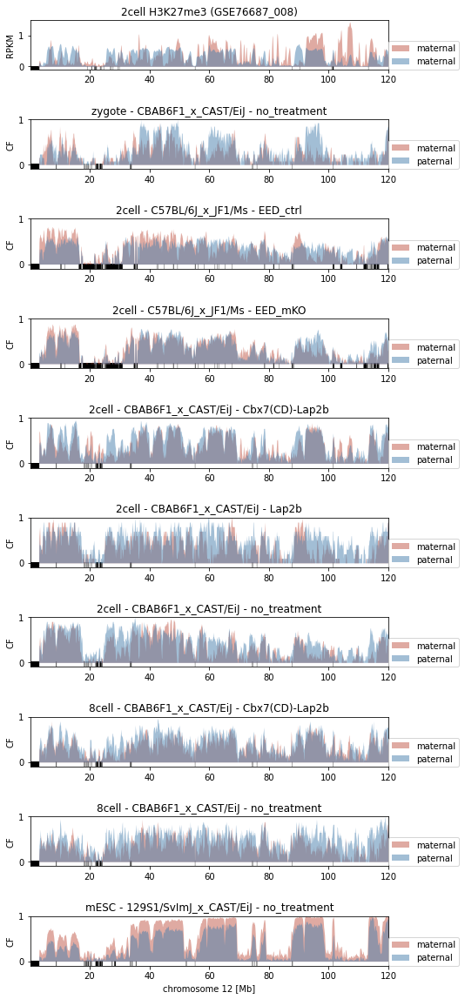

In [252]:
chrom = '12'
annotmp = anno_comb[anno_comb.is_heterozygous].copy()

plot_overlaid_allelic_profiles(annotmp, chrom)

__Saving plots for all chromosomes__

In [253]:
annotmp = anno_comb[anno_comb.is_heterozygous].copy()

for chrom in chrom_order[:-1]:
    plot_overlaid_allelic_profiles(annotmp, chrom)
    
    outfn = FIGOUTDIR + 'allelic_bias.example_track.whole_chr%s.CF_all_stages.alleles_overlaid.pdf' % chrom
    plt.savefig(outfn, bbox_inches='tight')
    plt.close()

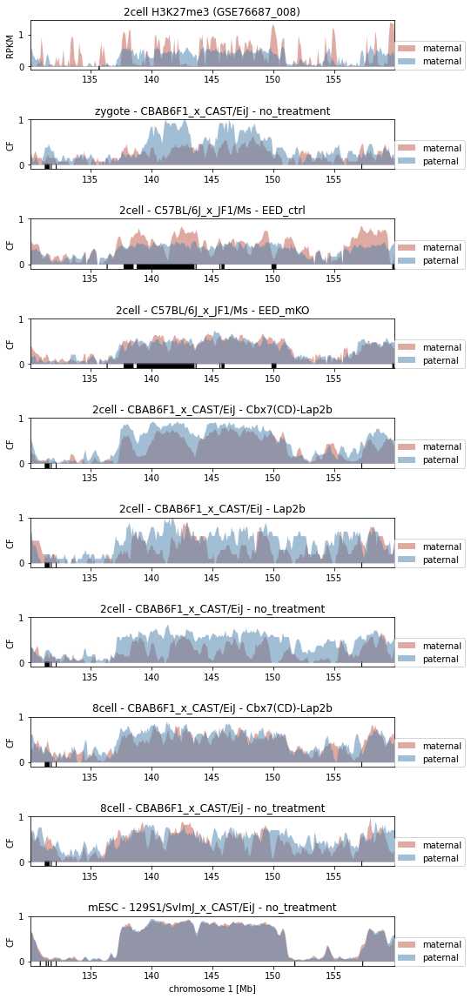

In [254]:
chrom, interval = regions_of_interest[0]
plot_overlaid_allelic_profiles(annotmp, chrom, interval)

In [255]:
for chrom, interval in regions_of_interest:
    plot_overlaid_allelic_profiles(annotmp, chrom, interval)
    
    outfn = FIGOUTDIR + 'allelic_bias.example_track.chr%s_%d_%d.CF_all_stages.alleles_overlaid.pdf' % (chrom, interval[0], interval[1])
    plt.savefig(outfn, bbox_inches='tight')
    plt.close()

## 9.7 Clustermap in silico profiles

### Function

In [119]:
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

In [120]:
def correlation_clustermap(anno_select, alleles, damid_metric='log2OE', corr_method='spearman', vrange=[]):
    
    # determine bin filtering
    filt_ind = np.concatenate([mapab[c] for c in chrom_order[:-2]]) > MINMAP
    if ('maternal' in alleles) or ('paternal' in alleles):
        for gt in anno_select['genotype'].unique():
            if gt in allele_filt_gt:
                a = np.concatenate([allele_filt_gt[gt][c] for c in chrom_order[:-2]])
                filt_ind = filt_ind & a
    
    # collect all CF values
    CF_values = dict()
    for _, row in anno_select.iterrows():
        sample = (row['stage'], row['genotype'], row['treatment'])
        
        for allele in alleles:
            
            if sample not in contact_freq[allele]:
                continue
            
            name = '%s:%s:%s:%s' % (row['stage'], row['genotype'], row['treatment'], allele)
            
            if damid_metric == 'CF':
                values = contact_freq[allele][sample]
            else:
                values = damid_insilico_logoe[allele][sample]
            
            CF_values[name] = np.concatenate([values[c] for c in chrom_order[:-2]])[filt_ind]
    CF_values = pd.DataFrame(CF_values)
    
    # compute correlation
    C = CF_values.corr(method=corr_method)
    
    # compute clustering
    linkage = hc.linkage(C, method='ward', optimal_ordering=True)
    order = hc.leaves_list(linkage)
    
    # figure set-up 
    figh = C.shape[0] * 0.4 if C.shape[0] > 5 else C.shape[0] * 0.8
    figw = figh*2
    fig, axes = plt.subplots(1,2,figsize=(figw,figh), gridspec_kw={'width_ratios': [3,C.shape[0]+4]})
    # plt.subplots_adjust(wspace=0)

    # plot correlationmap
    ax = axes[1]
    if len(vrange) == 2:
        p = ax.imshow(C.iloc[order,order], extent=[0,len(C),0,len(C)], cmap='YlOrRd', origin='lower', vmin=vrange[0], vmax=vrange[1])
    else:
        p = ax.imshow(C.iloc[order,order], extent=[0,len(C),0,len(C)], cmap='YlOrRd', origin='lower')
    
    # colorbar
    cbar = plt.colorbar(p, shrink=.5)
    if corr_method == 'spearman':
        cbar.ax.set_ylabel('Spearman\'s rho')
    elif corr_method == 'pearson':
        cbar.ax.set_ylabel('Pearson\'s r')
    
    # xticks
    ax.set_xticks(np.arange(len(C))+.5)
    labs = C.iloc[order,order].columns
    ax.set_xticklabels(labs, rotation=45, ha='right')

    # plot color legend pat/mat
    tmp = {'paternal': -1, 'combined': 0, 'maternal': 1}
    p = [tmp[l.split(':')[-1]] for l in labs]
    p = np.atleast_2d(p).T
    ax.imshow(p, extent=[-.5,-.1,0,len(C)], cmap='coolwarm', origin='lower', vmin=-1, vmax=1)

    # plot color bar stage
    p = [{'zygote': 0, '2cell': 1, '8cell': 2, 'mESC': 3}[l.split(':')[0]] for l in labs]
    p = np.atleast_2d(p).T
    ax.imshow(p, extent=[-1,-.6,0,len(C)], cmap='jet', origin='lower')

    ax.set_xlim(-1,len(C))
    
    # set title
    ax.set_title('Correlation based on %s values' % damid_metric)

    # plot dendrogram
    ax = axes[0]
    dn1 = hc.dendrogram(linkage, ax=ax, above_threshold_color='y',
                               orientation='left')
    ax.set_xticks([])
    ax.set_yticks([])

### All stages and conditions - combined alleles

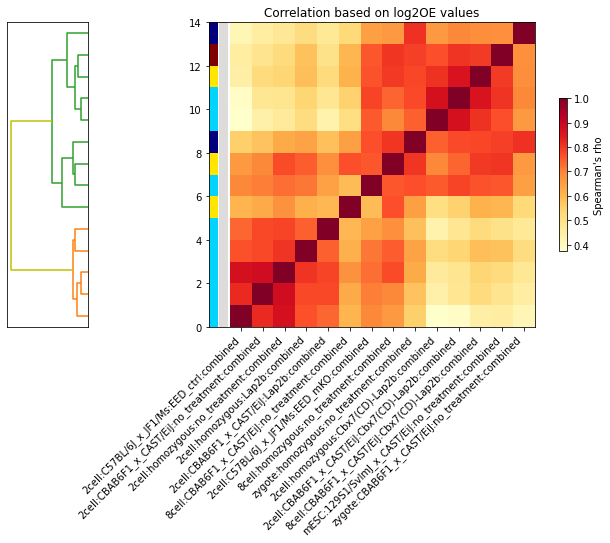

In [130]:
ind = (~anno_comb.treatment.isin(['Cbx7(CD)-Lbr', 'Cbx7(CD)-Emd']))
anno_select = anno_comb[ind].copy()
alleles = ['combined']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.all_stages.all_conditions.combined_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### All stages and conditions - separate alleles

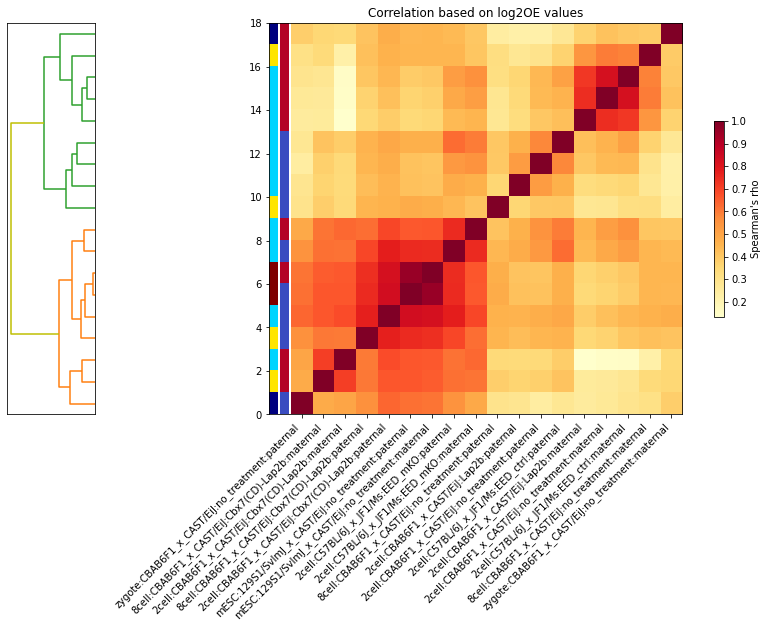

In [131]:
ind = (~anno_comb.treatment.isin(['Cbx7(CD)-Lbr', 'Cbx7(CD)-Emd']))
anno_select = anno_comb[ind].copy()
alleles = ['maternal', 'paternal']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.all_stages.hybrid_conditions.separate_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### Untreated stages and conditions - combined alleles

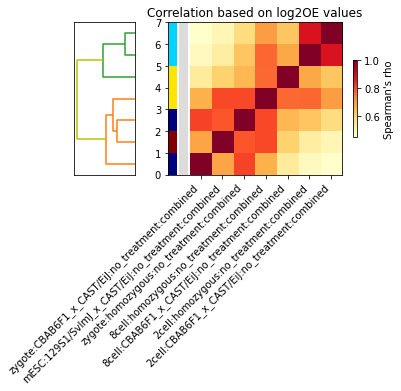

In [123]:
anno_select = anno_comb[anno_comb.treatment=='no_treatment'].copy()
alleles = ['combined']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.all_stages.untreated.combined_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### Untreated stages and conditions - homozygous - combined alleles

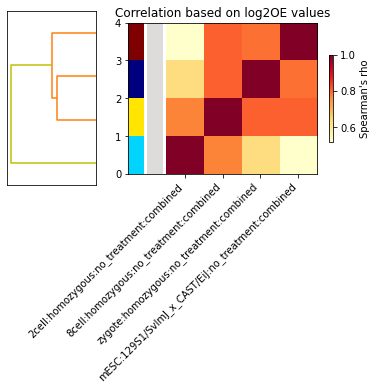

In [125]:
anno_select = anno_comb[(anno_comb.treatment=='no_treatment')&((~anno_comb.is_heterozygous)|(anno_comb['stage']=='mESC'))].copy()
alleles = ['combined']

correlation_clustermap(anno_select, alleles)
outfn = FIGOUTDIR + 'correlation_clustermap.all_stages.untreated_homozygous.combined_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### Untreated stages and conditions - separate alleles

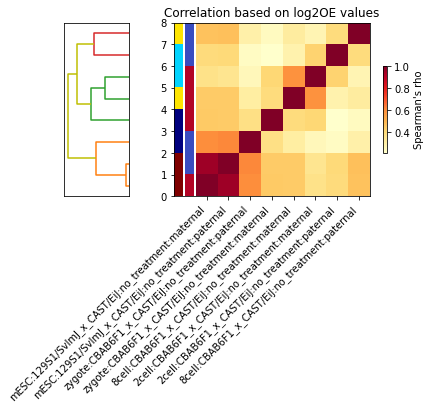

In [126]:
anno_select = anno_comb[anno_comb.treatment=='no_treatment'].copy()
alleles = ['maternal', 'paternal']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.all_stages.untreated_hybrid.separate_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### 2-cell stage only - combined alleles

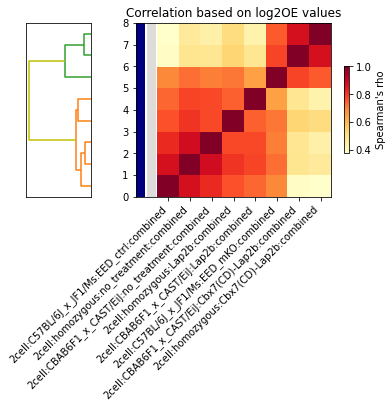

In [129]:
ind = (anno_comb.stage=='2cell') & (~anno_comb.treatment.isin(['Cbx7(CD)-Lbr', 'Cbx7(CD)-Emd']))
anno_select = anno_comb[ind].copy()
alleles = ['combined']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.2cell_stage.all_conditions.combined_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### 2-cell stage only - separate alleles

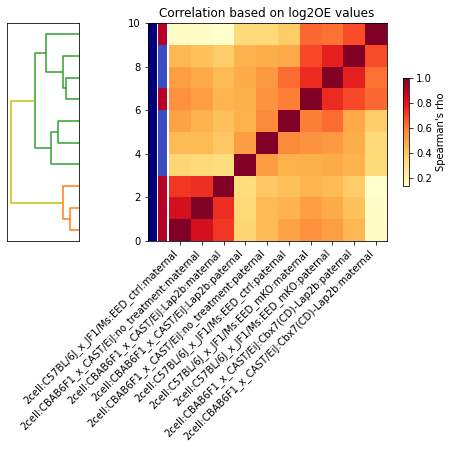

In [106]:
anno_select = anno_comb[anno_comb.stage=='2cell'].copy()
alleles = ['maternal', 'paternal']

correlation_clustermap(anno_select, alleles)

outfn = FIGOUTDIR + 'correlation_clustermap.2cell_stage.hybrid_conditions.separate_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### zygote, 2cell, mESC

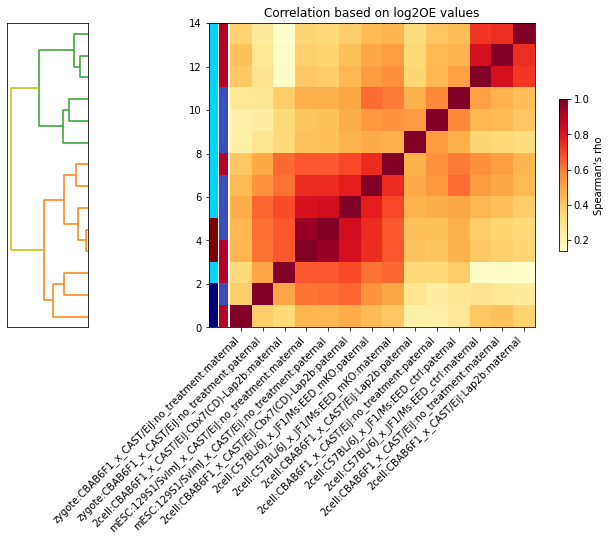

In [132]:
ind = (anno_comb.stage!='8cell') & (~anno_comb.treatment.isin(['Cbx7(CD)-Lbr', 'Cbx7(CD)-Emd']))
anno_select = anno_comb[ind].copy()
alleles = ['maternal', 'paternal']

correlation_clustermap(anno_select, alleles, corr_method='spearman')

outfn = FIGOUTDIR + 'correlation_clustermap.zygote_2cell_mESC.hybrid_conditions.separate_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')

### 2cell, mESC

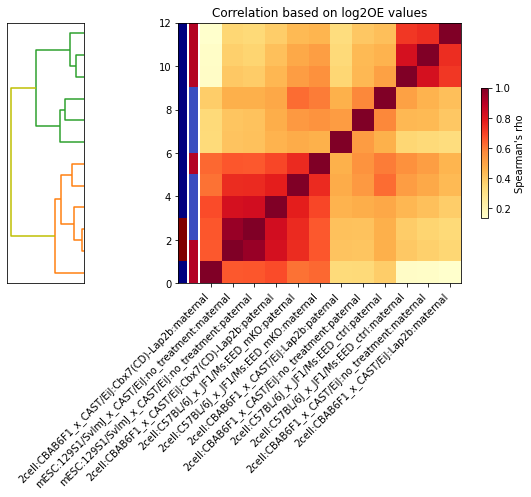

In [133]:
ind = anno_comb.stage.isin(['2cell', 'mESC']) & (~anno_comb.treatment.isin(['Cbx7(CD)-Lbr', 'Cbx7(CD)-Emd']))
anno_select = anno_comb[ind].copy()
alleles = ['maternal', 'paternal']

correlation_clustermap(anno_select, alleles, corr_method='spearman')

outfn = FIGOUTDIR + 'correlation_clustermap.2cell_mESC.hybrid_conditions.separate_alleles.log2OE.pdf'
plt.savefig(outfn, bbox_inches='tight')